In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd
# from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from cmcrameri import cm
from PIL import Image

import corner

from landscapes.module_helper_functions import modules_from_txt
from landscapes.landscapes import CellDiff_Dataset_Landscape
from landscapes.landscape_visuals import visualize_all

plt.rcParams.update({'figure.dpi': 100})  # Change to 200 for high res figures
plt.rcParams.update({'font.size': 15})  

%load_ext autoreload

In [4]:

# optimization_log 100_is the first 100 simulations of optimization_log

# data_dir = '../alfyn_results/saved_files/CellDiff_Dataset_Landscape/'
# file_name = data_dir + 'optimization_log_100.csv'
# 
# log = pd.read_csv(file_name, sep='\t', names=['Timecode', 'Init timecode', 'Fitness'], skiprows=1)
# print(log.head(5))
# print(log.shape)
# print(np.sum(log['Fitness']>-0.2))

data_dir = '../alfyn_results_stage2/saved_files_5/CellDiff_Dataset_Landscape/'
file_name = data_dir + 'optimization_log.csv'

log = pd.read_csv(file_name, sep='\t', names=['Timecode', 'Init timecode', 'Fitness'], skiprows=1)
print(log.head(5))
print(log.shape)
# log = log[-200:]
print(np.sum(log['Fitness']>-0.4))


          Timecode    Init timecode   Fitness
0  20241023-164603  20241011-193010 -0.467253
1  20241023-195217  20241011-193010 -0.448185
2  20241023-200611  20241011-215741 -0.448313
3  20241023-202026  20241011-221917 -1.316701
4  20241023-203428  20241011-224838 -0.492498
(242, 3)
62


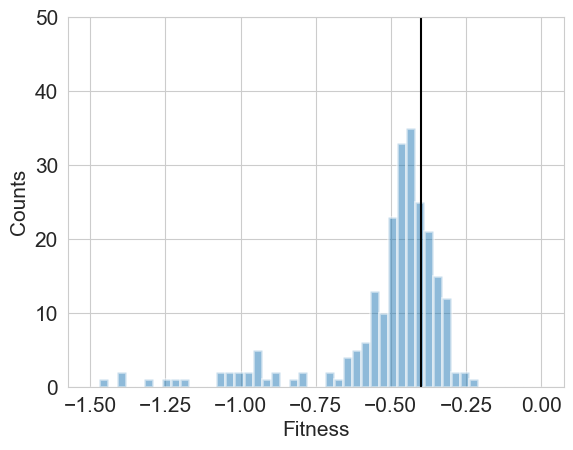

/var/folders/yn/r99j3qy962lg5cwmzc1dpqg40000gn/T/ipykernel_35909/1291617248.py:23: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  all_fitness[i] = log.loc[log['Timecode']==timecode, 'Fitness']


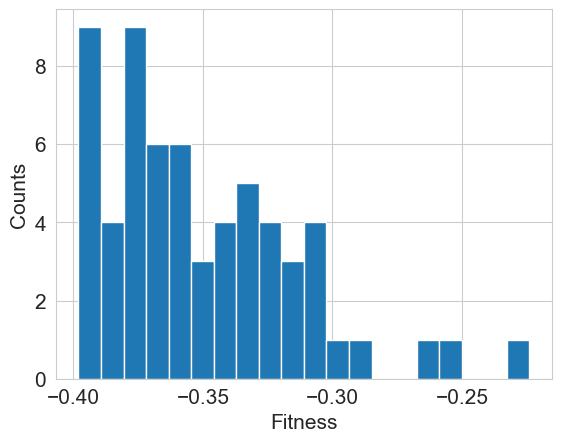

In [9]:
bins = np.linspace(-1.5, 0, 51)

plt.hist(log['Fitness'], bins=bins, density=False, alpha=0.5, histtype='bar', lw=2, label='All')
# plt.hist(log[:-600]['Fitness'], bins=bins, density=False, alpha=0.8, histtype='bar', label='N = 50')
# plt.hist(log[-600:-400]['Fitness'], bins=50, density=False, alpha=0.4, histtype='bar', label='N = 100')
# plt.hist(log[-400:]['Fitness'], bins=bins, density=False, alpha=0.9, histtype='bar', label='N = 200')

# plt.legend()

# plt.hist(log[-200:]['Fitness'], bins=50, density=True, alpha=0.5)
plt.vlines(-0.4, 0, 200, color='k')
plt.xlabel('Fitness')
plt.ylabel('Counts')
plt.ylim((0, 50))
plt.show()

fitness_threshold = -0.4   #### ______________
gen = 299
n_landscapes = len(log['Timecode'][log['Fitness'] > fitness_threshold])
all_fitness = np.zeros(n_landscapes)

for i, timecode in enumerate(log['Timecode'][log['Fitness'] > fitness_threshold]):
    all_fitness[i] = log.loc[log['Timecode']==timecode, 'Fitness']
    
timecodes = log['Timecode'][log['Fitness'] > fitness_threshold]
len(timecodes)

plt.hist(all_fitness, bins=20)
plt.xlabel('Fitness')
plt.ylabel('Counts')
plt.show()

In [10]:
def figure_from_timecode(timecode, name='landscape_1', data_dir=data_dir):
    filename = data_dir + timecode + '/result_' + name + '.png'
    image = Image.open(filename)
    display(image)

0 - red, 1 - orange, 2 - yellow, 3 - green, 4 - blue, 5 - purple 
Pairwise distances: 01, 02, 03, 04, 12, 13, 14, 23, 24, 34, ...
Module parameters x6 : a, s 
->  __ parameters 

0 1 0.5329589505764916
0 2 0.6916158700956235
0 3 0.8439560030403388
0 4 0.2615491552125973
0 5 0.7763140755693517
1 2 0.263098310866118
1 3 0.39424938790237657
1 4 0.4594391210519426
1 5 0.30929146652339046
2 3 0.1528209052932829
2 4 0.6931231883248358
2 5 0.09215491107187287
3 4 0.8406135892851251
3 5 0.08589732912649692
4 5 0.7595668430175749


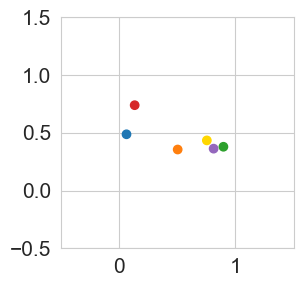

0 1 0.5329589505764915
0 2 0.6916158700956235
0 3 0.8439560030403389
0 4 0.2615491552125973
0 5 0.7763140755693517
1 2 0.263098310866118
1 3 0.39424938790237657
1 4 0.4594391210519426
1 5 0.3092914665233904
2 3 0.1528209052932829
2 4 0.6931231883248358
2 5 0.09215491107187286
3 4 0.8406135892851252
3 5 0.08589732912649693
4 5 0.7595668430175749


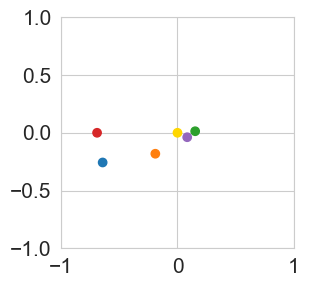

In [18]:
def transform_coords(old_coords, origin=0, direction=2, left=None, bottom=None):
    coords = old_coords - old_coords[origin]   # move origin to module 0
    d = np.linalg.norm(coords[direction])  # distance to module 1
    x, y = coords[direction, 0], coords[direction, 1]
    R = np.array([[x, y], [-y, x]])/d
    coords = (R @ coords.T).T
    if bottom is not None:
        if coords[bottom, 1] > 0:    # the last module is below 0 
            coords[:, 1] *= -1.
    if left is not None:
        if coords[left, 0] > 0:
            coords[:, 0] *= -1.
    return coords

plt.figure(figsize=(3,3))
n_points = 6
colors = ('tab:red', 'tab:orange', 'gold', 'tab:green', 'tab:blue', 'tab:purple',)
coords = np.random.random((n_points, 2))
for i in range(n_points):
    for j in range(i+1, n_points):
         print(i, j, np.linalg.norm(coords[i]-coords[j]))
plt.scatter(coords[:,0], coords[:,1], c=colors)
plt.xlim((-0.5,1.5))
plt.ylim((-0.5, 1.5))

plt.show()

coords = transform_coords(coords, origin=2, direction=0, left=0, bottom=4)

plt.figure(figsize=(3,3))
# plt.plot((0, 5), (0, 0), c='k', alpha=0.4)
# plt.plot((coords[-1, 0], coords[-1, 0]), (0, coords[-1, 1]), c='k', alpha=0.4)

for i in range(n_points):
    for j in range(i+1, n_points):
         print(i, j, np.linalg.norm(coords[i]-coords[j]))
plt.scatter(coords[:,0], coords[:,1], c=colors)
plt.xlim((-1,1))
plt.ylim((-1,1))
plt.show()


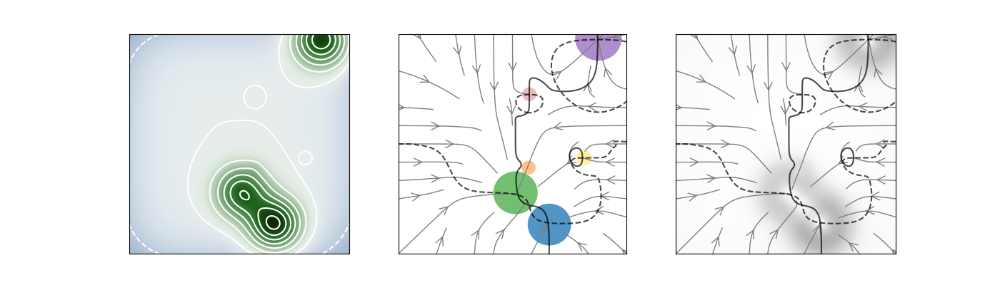

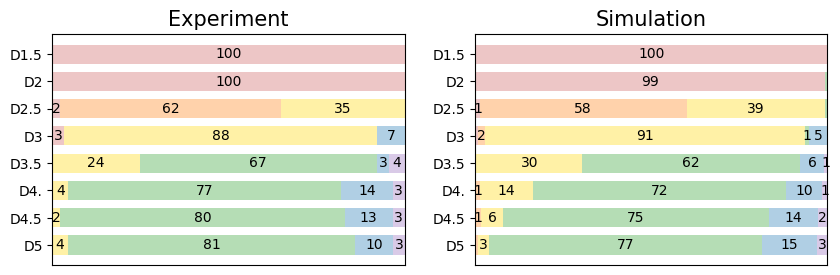

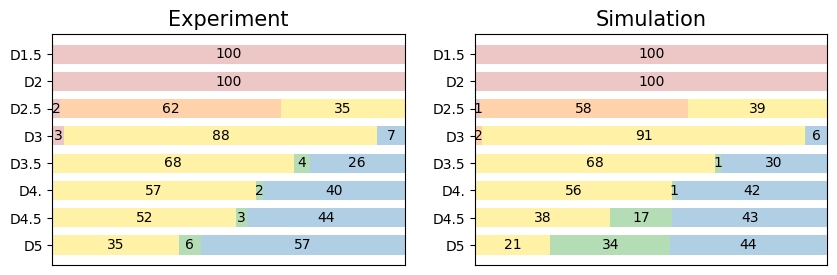

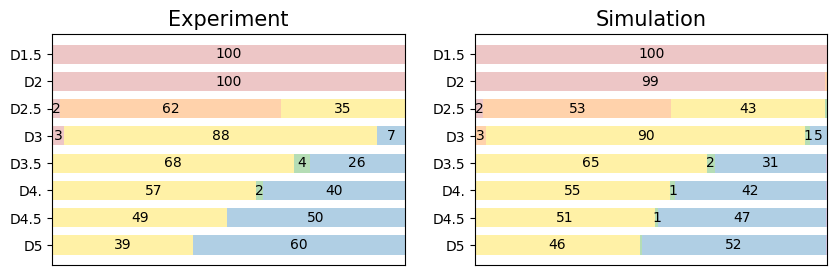

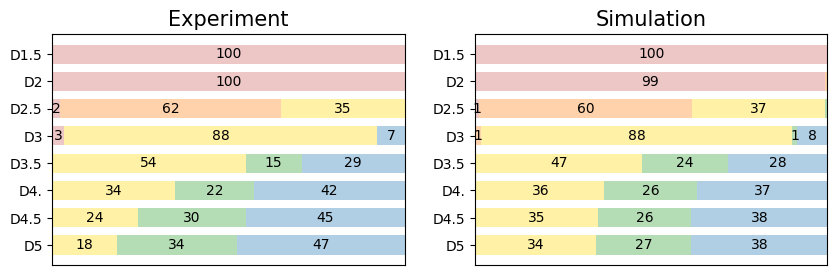

...

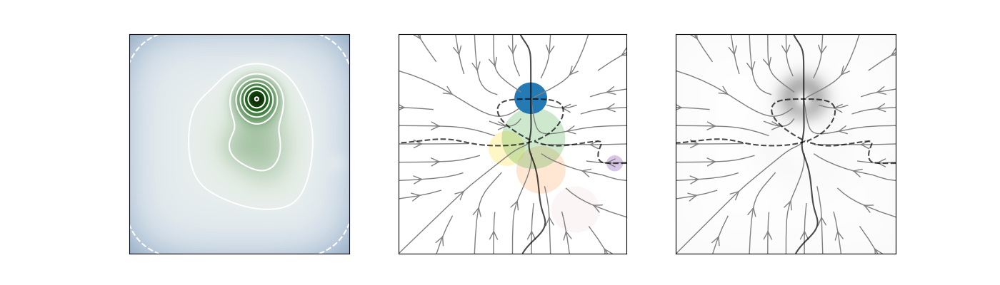

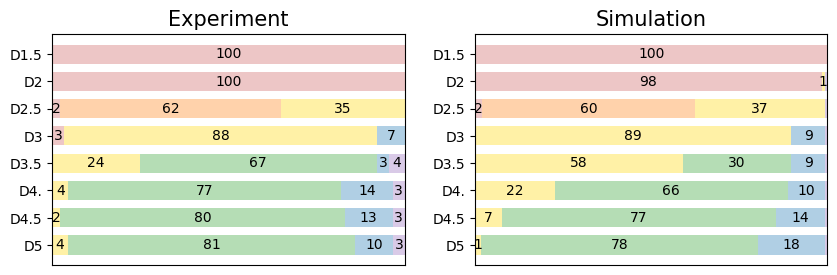

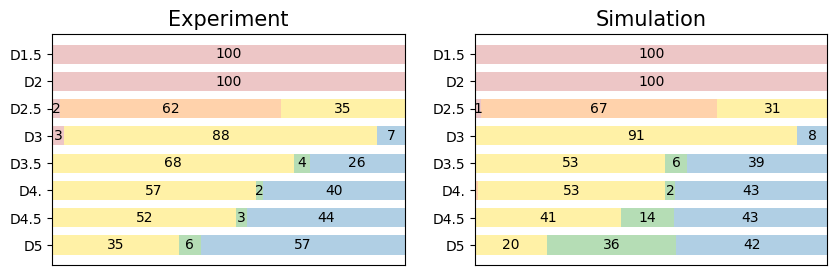

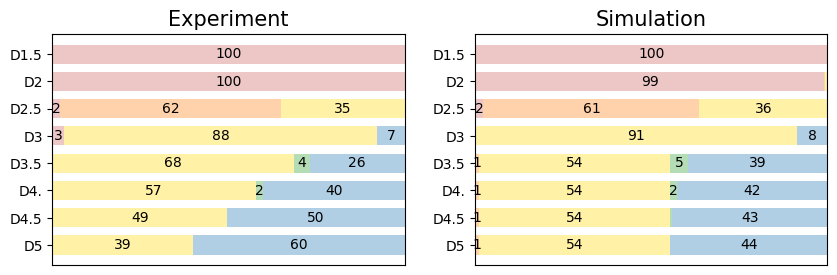

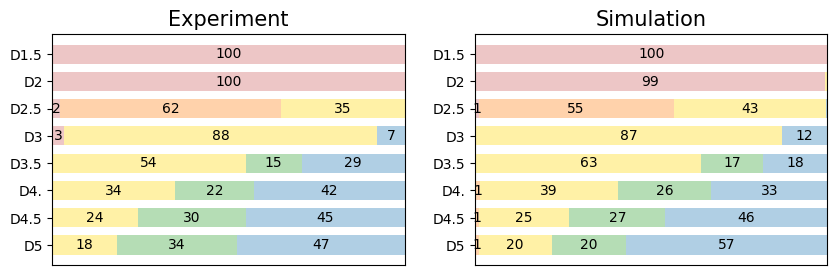

In [69]:
fitness_threshold = -0.3  #  best landscapes
gen = 300
n_landscapes = len(log['Timecode'][log['Fitness'] > fitness_threshold])
all_fitness = np.zeros((n_landscapes))

timecodes = log['Timecode'][log['Fitness'] > fitness_threshold]
# index = log.index[log['Fitness'] > fitness_threshold]
len(timecodes)

for i in range(n_landscapes):
    timecode = timecodes.iloc[i]
    # data_dir = data_dirs[index[i][0]]
    # figure_from_timecode(timecode, 'landscape_1', data_dir)
    figure_from_timecode(timecode, 'landscape_2', data_dir)
    # figure_from_timecode(timecode, 'cell_trajectories_0', data_dir)
    # figure_from_timecode(timecode, 'cell_trajectories_2', data_dir)
    figure_from_timecode(timecode, 'proportions_1', data_dir)
    figure_from_timecode(timecode, 'proportions_2', data_dir)
    figure_from_timecode(timecode, 'proportions_3', data_dir)
    
    figure_from_timecode(timecode, 'proportions_4', data_dir)
    # figure_from_timecode(timecode, 'fitness_traj', data_dir)



In [25]:
%autoreload

# data_dir = data_dirs[1]
timecode = log.iloc[-1]['Timecode']
filename = data_dir + timecode + '/' + timecode + '_module_list_' + str(300) + '.txt'
with open(filename, 'r') as f:
    module_list = modules_from_txt(filename) 

n_modules = len(module_list)

# n_pars = n_modules * (n_modules-1) // 2 + n_modules * (len(module_list[0].a) + len(module_list[0].s))
# n_pars = n_modules * (n_modules-1) // 2 + n_modules * (len(module_list[0].a) -1 + len(module_list[0].s) - 1)
n_pars = (n_modules-1) * 2 - 1 + n_modules * ( len(module_list[0].a) -1 + len(module_list[0].s) - 1)
print(len(module_list[0].a), len(module_list[0].s))
# n_pars = (n_modules-1) * 2 - 1 + n_modules * ( len(module_list[0].a) -1 )
# n_pars = n_modules * (n_modules-1) // 2   ##

print(n_landscapes, n_pars)
all_pars = np.zeros((n_landscapes, n_pars))   

colors = ('indianred', 'tab:orange', 'gold', 'tab:green', 'tab:blue', 'tab:purple')
        
    
def pars_from_timecode(timecode, data_dir, gen):
    par_names = []
    par_colors = []
    filename = data_dir + timecode + '/' + timecode + '_module_list_' + str(gen) + '.txt'
    with open(filename, 'r') as f:
        module_list = modules_from_txt(filename)
    # module_list = module_list[:2]
    
    n_modules = len(module_list)
    # n_pars = n_modules * (n_modules-1) // 2 + n_modules * (len(module_list[0].a) + len(module_list[0].s))
    # print(n_pars)
    # all_pars = np.zeros(n_pars)
    
    coords = np.zeros((n_modules, 2))
    for i, module in enumerate(module_list):
        # print(module)
        coords[i] = module.x, module.y
    pars = []
    
    
    origin = 2
    direction = 0
    coords = transform_coords(coords, origin=origin, direction=direction, left=0, bottom=4)     ###
    for i in range(0, n_modules):
        if i == origin: # x=0, y=0
            continue
        # par_names.append('x '+str(i))
        par_names.append('M'+str(i)+' x')
        par_colors.append(colors[i])
        pars.append(coords[i,0])
        if i == direction:  # y = 0
            continue
        # par_names.append('y '+str(i))
        par_names.append('M'+str(i)+' y')
        pars.append(coords[i,1])
        par_colors.append(colors[i])
    
    # for i in range(n_modules):
    #     for j in range(i+1, n_modules):
    #         par_names.append('Dist '+str(i)+str(j))
    #         pars.append(np.linalg.norm(coords[i]-coords[j]))
    #      # print(i, j, np.linalg.norm(coords[i]-coords[j]))
    # 
    for i, module in enumerate(module_list):
        pars.extend(module.a[1:])
        for j in range(1, len(module.a)):
            par_names.append('M'+str(i)+' a'+ str(j))
            par_colors.append(colors[i])
            
    for i, module in enumerate(module_list):
        pars.extend(module.s[1:])
        for j in range(1, len(module.s)):
            par_names.append('M'+str(i)+' s'+ str(j))
            par_colors.append(colors[i])
    # print(par_names)
    
    return np.array(pars), par_names, par_colors


5 5
5 57


In [26]:
def landscape_from_timecode(timecode, data_dir, gen, landscape_pars):
    filename = data_dir + timecode + '/' + timecode + '_module_list_' + str(gen) + '.txt'
    with open(filename, 'r') as f:
        module_list = modules_from_txt(filename)
    landscape = CellDiff_Dataset_Landscape(module_list, A0=landscape_pars['A0'])
    return landscape

landscape_pars = {
    'A0': 0.005,
}


    # image.show()
    

In [27]:
%autoreload

fitness_threshold = -0.4
n_landscapes = len(log['Timecode'][log['Fitness'] > fitness_threshold])
all_fitness = np.zeros((n_landscapes))


for i, timecode in enumerate(log['Timecode'][log['Fitness'] > fitness_threshold]):
    all_fitness[i] = log.loc[log['Timecode']==timecode, 'Fitness']
    

/var/folders/yn/r99j3qy962lg5cwmzc1dpqg40000gn/T/ipykernel_35909/55052863.py:9: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  all_fitness[i] = log.loc[log['Timecode']==timecode, 'Fitness']


In [30]:
timecodes = log['Timecode'][log['Fitness'] > fitness_threshold]
index = log.index[log['Fitness'] > fitness_threshold]
len(timecodes)

all_pars = np.zeros((n_landscapes, n_pars))   
gen = 300


for i, timecode in enumerate(timecodes):
    print(timecode)
    # if index[i][0] == 0:
    #     gen = 299
    #     data_dir = data_dirs[0]
    # else:
    #     gen = 300
    #     data_dir = data_dirs[1]
        
    all_pars[i, :], par_names, par_colors = pars_from_timecode(timecode, data_dir, gen)
    

20241023-213101
20241023-224029
20241023-234055
20241024-001039
20241024-004224
20241024-012339
20241024-020439
20241024-024645
20241024-030053
20241024-035556
20241024-045312
20241024-053406
20241024-061714
20241024-070041
20241024-072856
20241024-081140
20241024-090820
20241024-100403
20241024-110017
20241024-112915
20241024-114248
20241024-115710
20241024-135143
20241024-140618
20241024-173705
20241024-180844
20241024-185449
20241024-211518
20241024-212934
20241024-214426
20241024-221301
20241024-224037
20241025-010134
20241025-014626
20241025-021432
20241025-031131
20241025-032458
20241025-040734
20241025-063000
20241025-071149
20241025-075530
20241025-083724
20241025-085031
20241025-090508
20241025-100003
20241025-111147
20241025-130423
20241025-141350
20241025-162744
20241025-172147
20241025-190433
20241025-194713
20241025-211220
20241025-212704
20241025-215605
20241025-223855
20241025-232452
20241025-234008
20241026-005020
20241026-010350
20241026-025657
20241026-045235


In [31]:
print(par_names)
print(par_colors)

['M0 x', 'M1 x', 'M1 y', 'M3 x', 'M3 y', 'M4 x', 'M4 y', 'M5 x', 'M5 y', 'M0 a1', 'M0 a2', 'M0 a3', 'M0 a4', 'M1 a1', 'M1 a2', 'M1 a3', 'M1 a4', 'M2 a1', 'M2 a2', 'M2 a3', 'M2 a4', 'M3 a1', 'M3 a2', 'M3 a3', 'M3 a4', 'M4 a1', 'M4 a2', 'M4 a3', 'M4 a4', 'M5 a1', 'M5 a2', 'M5 a3', 'M5 a4', 'M0 s1', 'M0 s2', 'M0 s3', 'M0 s4', 'M1 s1', 'M1 s2', 'M1 s3', 'M1 s4', 'M2 s1', 'M2 s2', 'M2 s3', 'M2 s4', 'M3 s1', 'M3 s2', 'M3 s3', 'M3 s4', 'M4 s1', 'M4 s2', 'M4 s3', 'M4 s4', 'M5 s1', 'M5 s2', 'M5 s3', 'M5 s4']
['indianred', 'tab:orange', 'tab:orange', 'tab:green', 'tab:green', 'tab:blue', 'tab:blue', 'tab:purple', 'tab:purple', 'indianred', 'indianred', 'indianred', 'indianred', 'tab:orange', 'tab:orange', 'tab:orange', 'tab:orange', 'gold', 'gold', 'gold', 'gold', 'tab:green', 'tab:green', 'tab:green', 'tab:green', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:purple', 'tab:purple', 'tab:purple', 'tab:purple', 'indianred', 'indianred', 'indianred', 'indianred', 'tab:orange', 'tab:orange',

In [32]:
colors

('indianred', 'tab:orange', 'gold', 'tab:green', 'tab:blue', 'tab:purple')

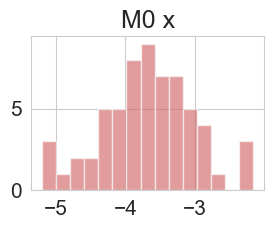

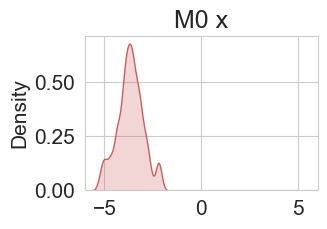

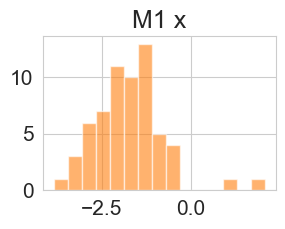

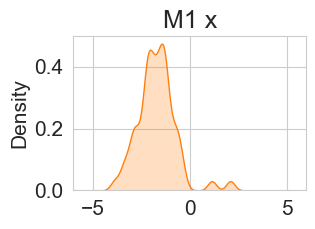

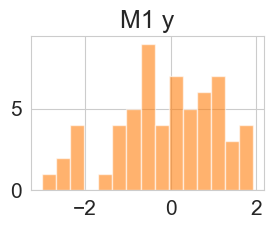

...

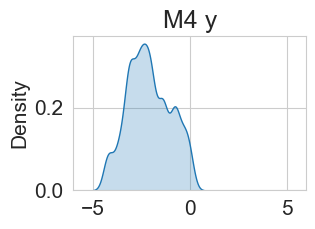

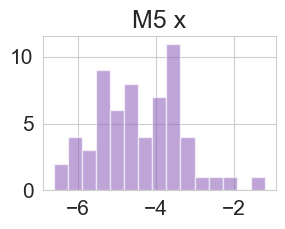

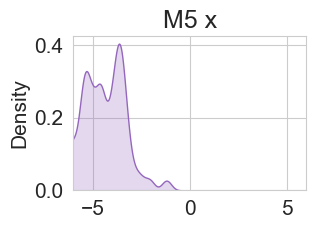

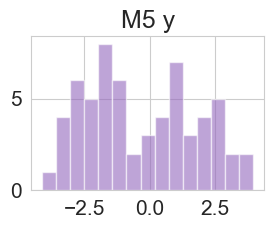

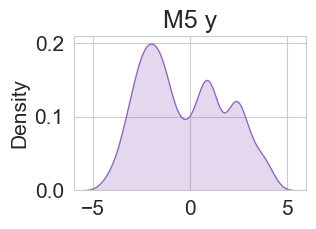

In [34]:
# all_pars

# for j in range(10):
for j in range(9):
    plt.figure(figsize=(3,2))
    plt.hist(all_pars[:, j], bins=15, alpha=0.6, color=par_colors[j])
    plt.title(par_names[j])
    plt.show()
    plt.figure(figsize=(3,2))
    sns.kdeplot(all_pars[:, j], fill=True, bw_adjust=0.5, color=par_colors[j])
    plt.title(par_names[j])
    # plt.xlim([0, 10])

    plt.xlim((-6,6))
    plt.show()

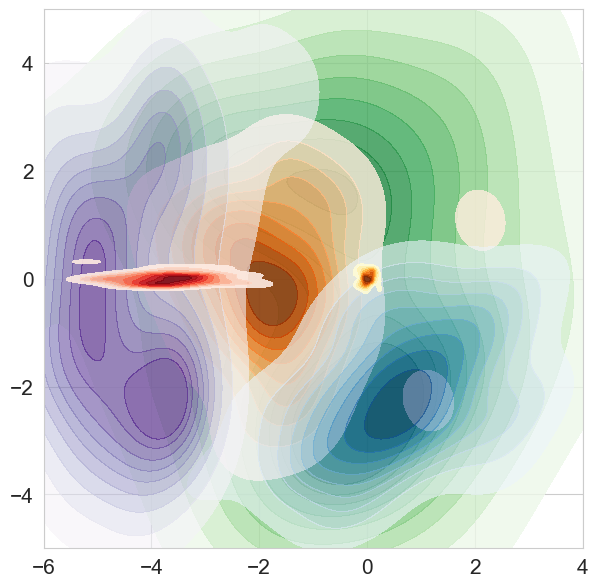

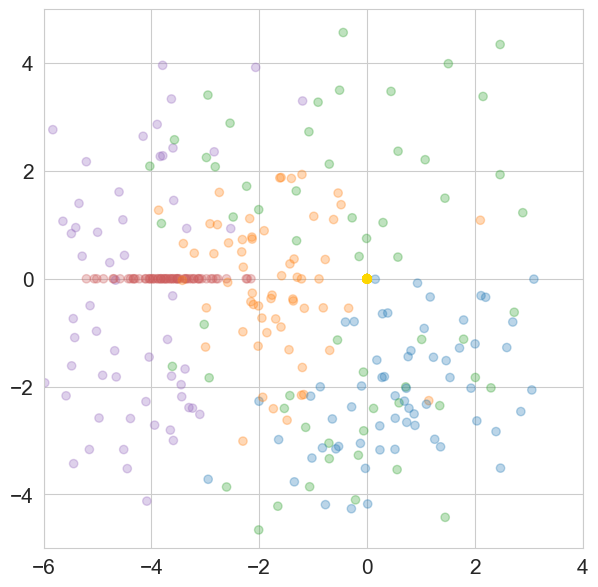

In [67]:
fig, ax = plt.subplots(figsize=(7,7))
sns.kdeplot(x=all_pars[:, 3], y=all_pars[:, 4], cmap='Greens', fill=True, alpha=0.8)
sns.kdeplot(x=all_pars[:, 1], y=all_pars[:, 2], cmap='Oranges', fill=True, alpha=0.8)

sns.kdeplot(x=all_pars[:, 5], y=all_pars[:, 6], cmap='Blues', fill=True, alpha=0.6)
sns.kdeplot(x=all_pars[:, 7], y=all_pars[:, 8], cmap='Purples', fill=True, alpha=0.6)

sns.kdeplot(x=all_pars[:, 0], y=0.1*np.random.randn(n_landscapes), cmap='Reds', fill=True, alpha=0.9)
sns.kdeplot(x=0.1*np.random.randn(n_landscapes), y=0.1*np.random.randn(n_landscapes), cmap='YlOrBr', fill=True, alpha=0.9)

plt.ylim((-5,5))
plt.xlim((-4,6))
plt.xlim((-6, 4))
# plt.ylim((-3,3))
# plt.xlim((-3,3))
ax.set_aspect('equal')
plt.show()

fig, ax = plt.subplots(figsize=(7,7))


for i in range(n_landscapes):
    coords = np.zeros((6, 2))
    coords[0, 0] = all_pars[i, 0]
    coords[1, :] = all_pars[i, 1:3]
    coords[3, :] = all_pars[i, 3:5]
    coords[4, :] = all_pars[i, 5:7]
    coords[5, :] = all_pars[i, 7:9]
    # coords[:, 0] *= -1
    # coords[:, 0] += (coords[0, 0] + coords[2,0])/2
    
    # coords[1, :] = all_pars[i, :2]
    # coords[2, 0] = all_pars[i, 2]
    # coords[3, :] = all_pars[i, 3:5]
    # coords[4, :] = all_pars[i, 5:7]
    # coords /= coords[2, 0]

# for i in range(n_landscapes):
    plt.scatter(coords[:, 0], coords[:, 1], c=colors, alpha=0.3, edgecolors=None)
# 
#     plt.plot(coords[0:3, 0], coords[0:3, 1], linewidth=1, alpha=0.15, c='darkorange')
#     
#     plt.plot(coords[-2:, 0], coords[-2:, 1], linewidth=1, alpha=0.2, c='seagreen')
    
# for m in range(5):


plt.ylim((-5,5))
plt.xlim((-4,6))
plt.xlim((-6, 4))
# plt.ylim((-3,3))
# plt.xlim((-3,3))
ax.set_aspect('equal')
plt.show()

In [38]:
par_names[26]

'M4 a2'

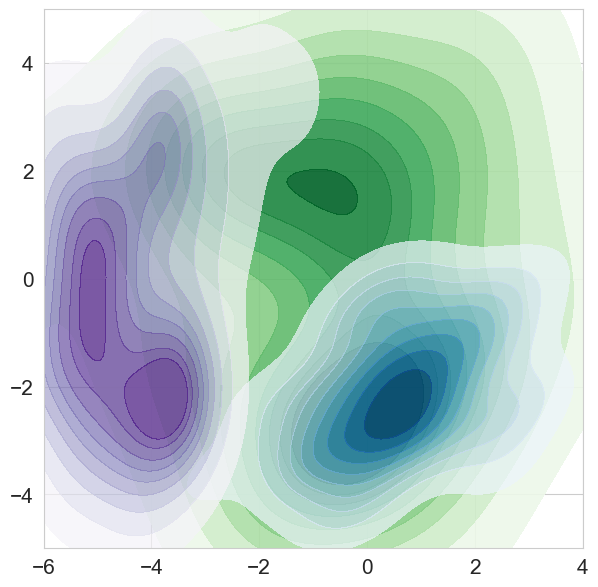

In [39]:
fig, ax = plt.subplots(figsize=(7,7))
sns.kdeplot(x=all_pars[:, 3], y=all_pars[:, 4], cmap='Greens', fill=True, alpha=0.9)
# sns.kdeplot(x=all_pars[:, 1], y=all_pars[:, 2], cmap='Oranges', fill=True, alpha=0.8)

sns.kdeplot(x=all_pars[:, 5], y=all_pars[:, 6], cmap='Blues', fill=True, alpha=0.7)
sns.kdeplot(x=all_pars[:, 7], y=all_pars[:, 8], cmap='Purples', fill=True, alpha=0.7)


# sns.kdeplot(x=all_pars[:, 0], y=0.1*np.random.randn(n_landscapes), cmap='Reds', fill=True, alpha=0.9)
# sns.kdeplot(x=0.1*np.random.randn(n_landscapes), y=0.1*np.random.randn(n_landscapes), cmap='YlOrBr', fill=True, alpha=0.9)

plt.ylim((-5,5))
plt.xlim((-4,6))
plt.xlim((-6, 4))
# plt.ylim((-3,3))
# plt.xlim((-3,3))
ax.set_aspect('equal')
plt.show()

In [40]:
# fig, ax = plt.subplots(figsize=(7,7))
# sns.kdeplot(x=all_pars[:, 3], y=all_pars[:, 4], weights=all_pars[:, 24], cmap='Greens', fill=True, alpha=0.7)
# # sns.kdeplot(x=all_pars[:, 1], y=all_pars[:, 2], cmap='Oranges', fill=True, alpha=0.8)
# 
# sns.kdeplot(x=all_pars[:, 5], y=all_pars[:, 6], cmap='Blues', weights=all_pars[:, 26], fill=True, alpha=0.7)
# 
# # sns.kdeplot(x=all_pars[:, 0], y=0.1*np.random.randn(n_landscapes), cmap='Reds', fill=True, alpha=0.9)
# # sns.kdeplot(x=0.1*np.random.randn(n_landscapes), y=0.1*np.random.randn(n_landscapes), cmap='YlOrBr', fill=True, alpha=0.9)
# 
# plt.ylim((-5,5))
# plt.xlim((-4,6))
# plt.xlim((-6, 4))
# # plt.ylim((-3,3))
# # plt.xlim((-3,3))
# ax.set_aspect('equal')
# plt.show()

In [22]:
print(all_pars[0])

[-5.08905992 -3.64799952  1.60597954 -3.19513136  0.13248069  0.72628535
 -2.45462721  8.09998117  7.20621327  6.18751628  0.04101805 14.29679268
  7.93497685 14.63360377 11.82814954 14.81091108  4.58881946  0.20692131
  1.36969492  0.86451614  1.46105313  1.46555063  0.5684098   0.3851729
  1.20441993  1.36460081  0.79881641]


In [49]:
par_names[32]

'M5 a4'

In [50]:
par_names

['M0 x',
 'M1 x',
 'M1 y',
 'M3 x',
 'M3 y',
 'M4 x',
 'M4 y',
 'M5 x',
 'M5 y',
 'M0 a1',
 'M0 a2',
 'M0 a3',
 'M0 a4',
 'M1 a1',
 'M1 a2',
 'M1 a3',
 'M1 a4',
 'M2 a1',
 'M2 a2',
 'M2 a3',
 'M2 a4',
 'M3 a1',
 'M3 a2',
 'M3 a3',
 'M3 a4',
 'M4 a1',
 'M4 a2',
 'M4 a3',
 'M4 a4',
 'M5 a1',
 'M5 a2',
 'M5 a3',
 'M5 a4',
 'M0 s1',
 'M0 s2',
 'M0 s3',
 'M0 s4',
 'M1 s1',
 'M1 s2',
 'M1 s3',
 'M1 s4',
 'M2 s1',
 'M2 s2',
 'M2 s3',
 'M2 s4',
 'M3 s1',
 'M3 s2',
 'M3 s3',
 'M3 s4',
 'M4 s1',
 'M4 s2',
 'M4 s3',
 'M4 s4',
 'M5 s1',
 'M5 s2',
 'M5 s3',
 'M5 s4']

In [52]:
len(par_names)

57

In [53]:
def circle_plot(pars):
    circles = []
    coords = np.zeros((6, 2))
    coords[0, 0] = pars[0]
    coords[1, :] = pars[1:3]
    coords[3, :] = pars[3:5]
    coords[4, :] = pars[5:7]
    coords[5, :] = pars[7:9]
    amplitude_idx = np.arange(9, 33, 4, dtype='int')
    size_idx = np.arange(33, 57, 4, dtype='int') #+ int(regime)-1
    
    fig = plt.figure(figsize=(7,7))
    ax = plt.gca()
    
    
    for regime in range(4):
        amplitudes = pars[amplitude_idx+regime]
        sizes = pars[size_idx+regime] 
  #+ int(regime)-1
    # print(amplitude_idx)
    # print(par_names[amplitude_idx])


    # print(par_names[size_idx])
    # amplitudes = pars[amplitude_idx]
    # sizes = pars[size_idx]
    

        for i in range(6):
            circle = plt.Circle(coords[i], 1.18 * sizes[i], color=colors[i],
                                      fill=False, alpha=0.25 * np.sqrt(amplitudes[i]), clip_on=True, linewidth=4, linestyle='solid')
            ax.add_patch(circle)
        

    # 
    # for i in range(6):
    #     circle = plt.Circle(coords[i], 1.18 * sizes[i], color=colors[i],
    #                               fill=True, alpha=0.25 * np.sqrt(amplitudes[i]), clip_on=True, linewidth=0)
    #     ax.add_patch(circle)
    
    ax.set_xlim((-6,6))
    ax.set_ylim((-6,6))
    ax.axis('off')
    ax.set_aspect('equal')
    
    plt.show(fig)
    

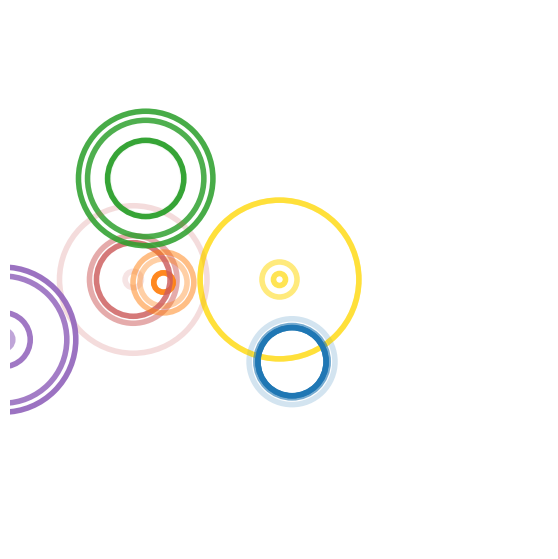

In [74]:
circle_plot(all_pars[4])

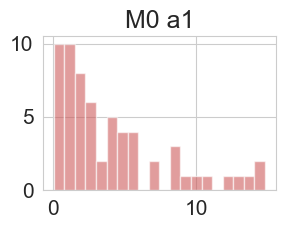

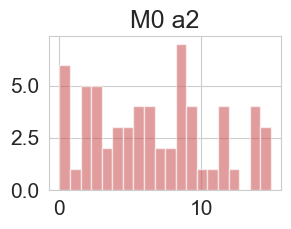

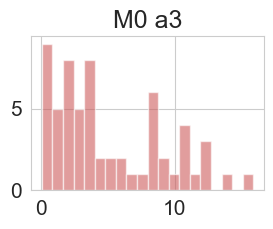

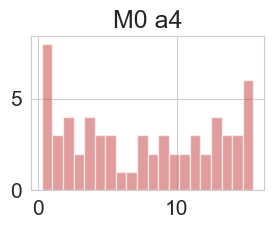

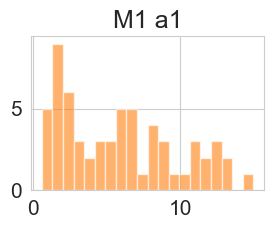

...

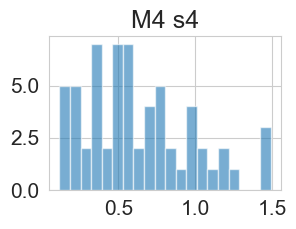

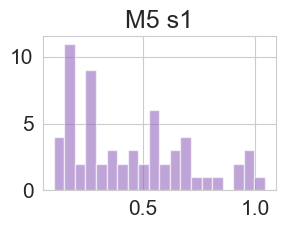

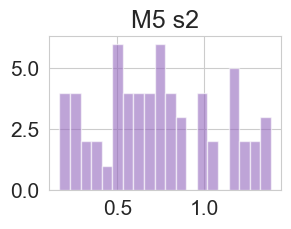

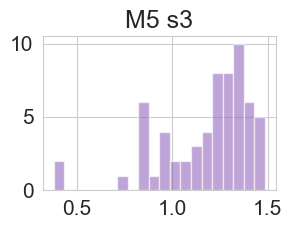

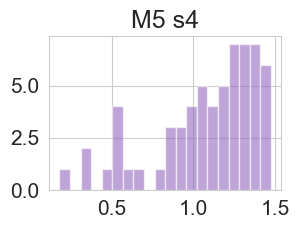

In [59]:
for j in range(9, n_pars):
    plt.figure(figsize=(3,2))
    plt.hist(all_pars[:, j], bins=20, alpha=0.6, color=par_colors[j])
    plt.title(par_names[j])
    # plt.xlim((-3,3))
    
    # plt.xlim([0, 10])
    plt.show()
    
    # plt.figure(figsize=(3,2))
    # sns.kdeplot(all_pars[:, j], fill=True, bw_adjust=0.4, color=par_colors[j], cut=0.)
    # plt.title(par_names[j])
   #### # plt.xlim([0, 10])
    # 
    # plt.xlim(left=0, right=1.5)
    # if np.max(all_pars[:, j]>2):
    #     plt.xlim(left=0, right=16)
        
    plt.show()

In [60]:
# for j in range(7, 17):
#     plt.figure(figsize=(3,2))
#     plt.hist(all_pars[:, j]*(all_pars[:, j+10]**2), bins=20, alpha=0.6, color=par_colors[j])
#     plt.title(par_names[j]+''+par_names[j+10])
#     # plt.xlim((-3,3))
#     
#     # plt.xlim([0, 10])
#     plt.show()

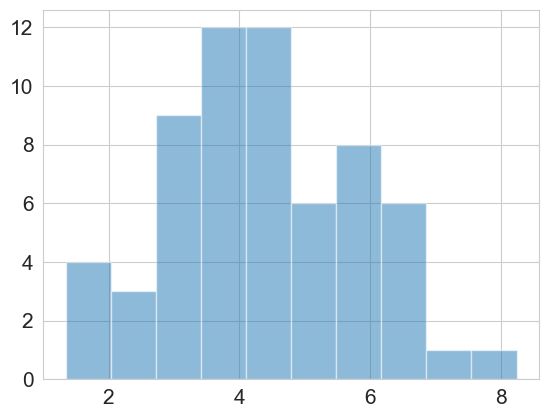

In [61]:
plt.hist(np.linalg.norm((all_pars[:, [3,5]] - all_pars[:, [4,6]]), axis = 1), alpha=0.5)
plt.show()

(62, 57)


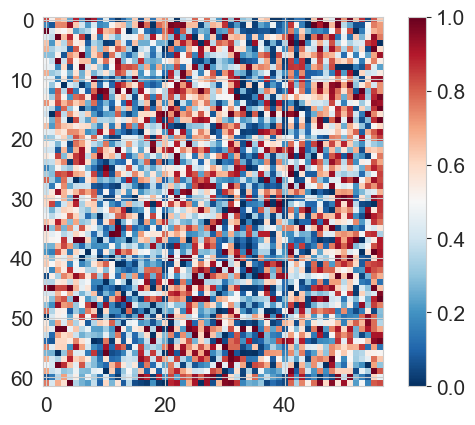

In [63]:
# scaler = StandardScaler()
scaler = MinMaxScaler()
# scaler = RobustScaler()
scaler.fit(all_pars)
# print(scaler.mean_)
scaled_pars = scaler.transform(all_pars)
print(all_pars.shape)

plt.imshow(scaled_pars, interpolation=None, cmap='RdBu_r', aspect=1)
plt.colorbar()
plt.show()


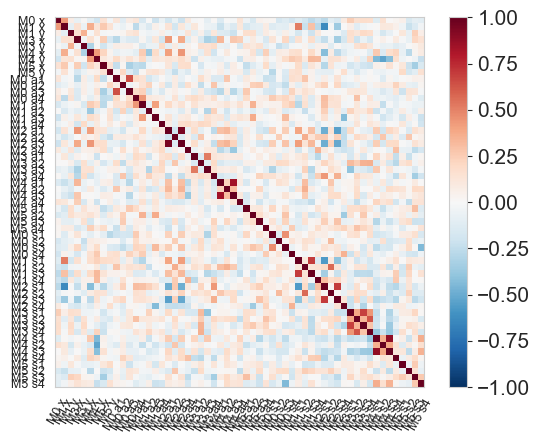

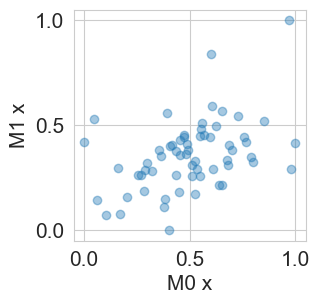

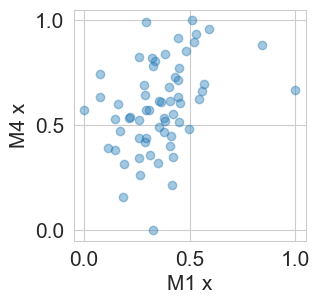

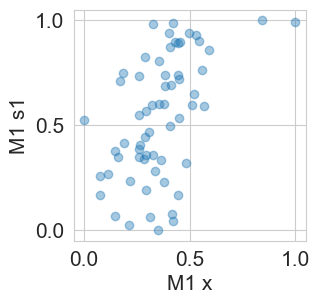

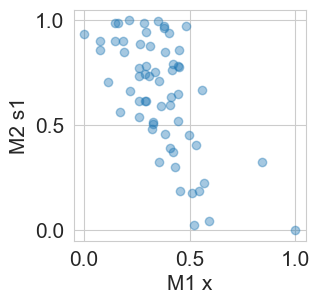

...

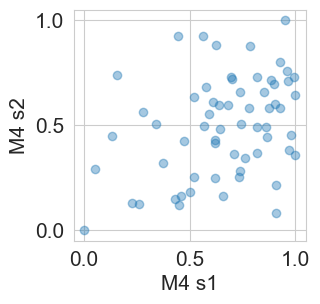

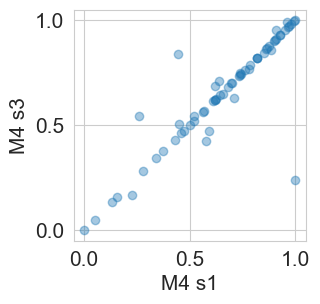

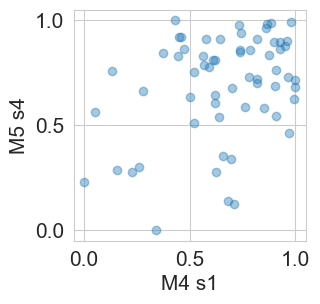

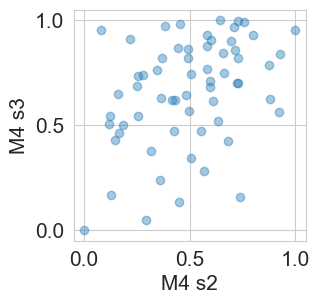

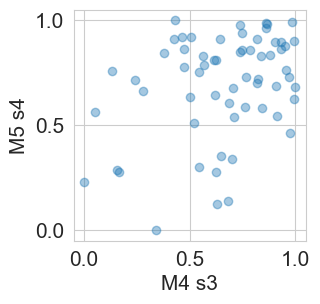

In [64]:

cov = np.corrcoef(all_pars, rowvar=False)
plt.imshow(cov, interpolation=None, cmap='RdBu_r', vmin=-1, vmax=1)
ax = plt.gca()
plt.xticks(ticks=range(n_pars), labels=par_names, size=9, rotation=60)
plt.yticks(ticks=range(n_pars), labels=par_names, size=9)
plt.colorbar()
ax.grid(False)
plt.show()


def corr_plot(par_i, par_j, pars):
    plt.figure(figsize=(3,3))
    plt.scatter(pars[:, par_i], scaled_pars[:, par_j], alpha=0.4)
    plt.xlabel(par_names[par_i])
    plt.ylabel(par_names[par_j])
    plt.yticks((0., 0.5, 1.))
    plt.xticks((0., 0.5, 1.))
    ax=plt.gca()
    # ax.grid(False)
    plt.show()


idx = np.where(np.abs(cov) > 0.3)
for i in range(len(idx[0])):
    if idx[0][i] < idx[1][i]:
        corr_plot(idx[0][i], idx[1][i], scaled_pars)
    

In [224]:
# corr_plot(3, 5, scaled_pars)
# corr_plot(4, 6, scaled_pars)
# corr_plot(4, 6, scaled_pars)
# corr_plot(3, 4, scaled_pars)
# corr_plot(5, 6, scaled_pars)

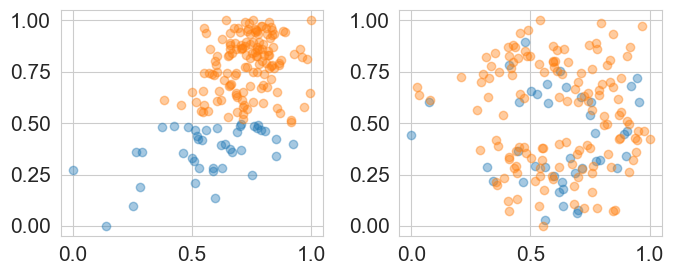

In [29]:
fig, ax = plt.subplots(1, 2, figsize=(7,3))
idx = scaled_pars[:, 6] < 0.5
ax[0].scatter(scaled_pars[idx, 5], scaled_pars[idx, 6], alpha=0.4)
ax[1].scatter(scaled_pars[idx, 3], scaled_pars[idx, 4], alpha=0.4)
idx = scaled_pars[:, 6] >= 0.5
ax[0].scatter(scaled_pars[idx, 5], scaled_pars[idx, 6], alpha=0.4)
ax[1].scatter(scaled_pars[idx, 3], scaled_pars[idx, 4], alpha=0.4)
plt.tight_layout()
plt.show()

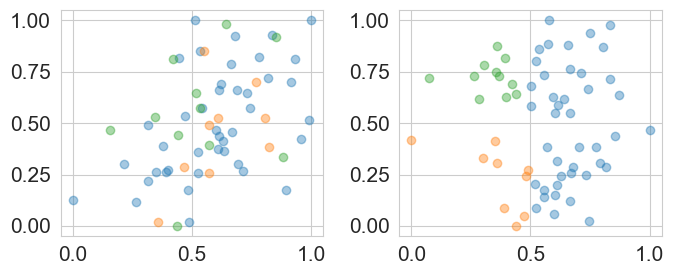

In [65]:
fig, ax = plt.subplots(1, 2, figsize=(7,3))
idx = scaled_pars[:, 3] >= 0.5
ax[0].scatter(scaled_pars[idx, 5], scaled_pars[idx, 6], alpha=0.4)
ax[1].scatter(scaled_pars[idx, 3], scaled_pars[idx, 4], alpha=0.4)

idx = (scaled_pars[:, 3] < 0.5) * (scaled_pars[:, 4] < 0.5)
ax[0].scatter(scaled_pars[idx, 5], scaled_pars[idx, 6], alpha=0.4)
ax[1].scatter(scaled_pars[idx, 3], scaled_pars[idx, 4], alpha=0.4)

idx = (scaled_pars[:, 3] < 0.5) * (scaled_pars[:, 4] > 0.5)
ax[0].scatter(scaled_pars[idx, 5], scaled_pars[idx, 6], alpha=0.4)
ax[1].scatter(scaled_pars[idx, 3], scaled_pars[idx, 4], alpha=0.4)
plt.tight_layout()
plt.show()

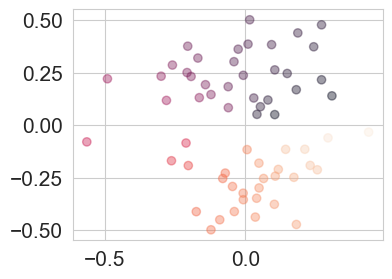

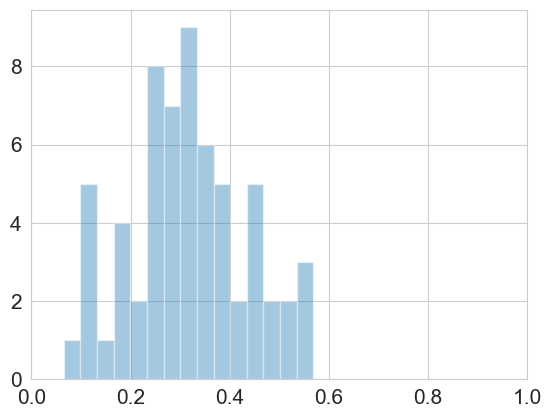

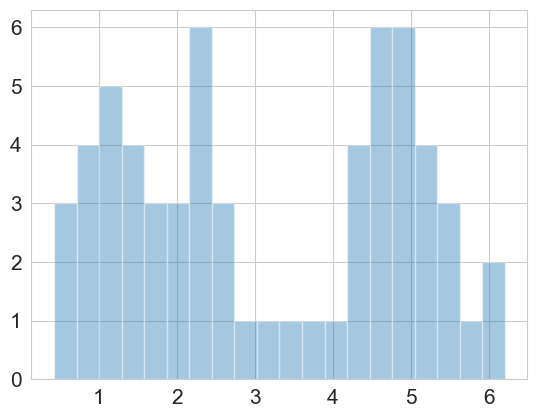

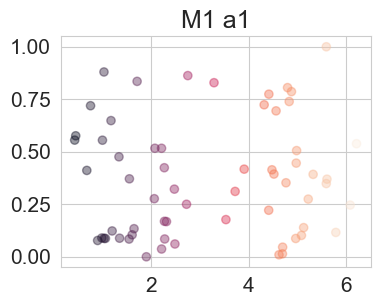

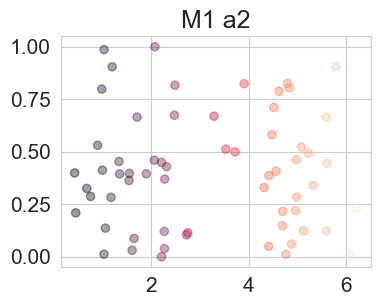

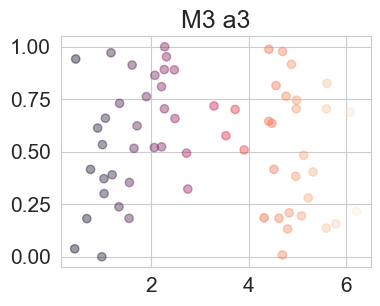

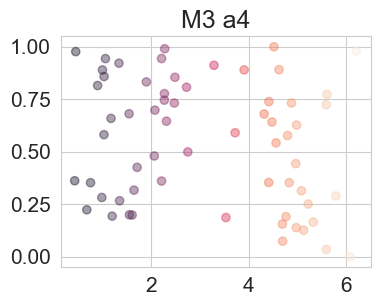

In [66]:
fig, ax = plt.subplots(1, 1, figsize=(4,3))
x = scaled_pars[:, 3]-np.mean(scaled_pars[:, 3])
y = scaled_pars[:, 4]-np.mean(scaled_pars[:, 4])

angles = (np.arctan2(y, x)+2*np.pi) %(2*np.pi)
radii = np.sqrt(x**2 + y**2)
ax.scatter(x, y, alpha=0.4, c=angles)
# plt.colorbar()
plt.show()

plt.hist(radii, bins=15, alpha=0.4)
plt.xlim((0, 1))
plt.show()
plt.hist(angles, bins=20, alpha=0.4)
# plt.xlim((-np.pi, np.pi))
plt.show()


for par in (13, 14, 23, 24):
# for par in (15, 16, 25, 26):
    
    plt.figure(figsize=(4,3))
    plt.scatter(angles, scaled_pars[:, par], alpha=0.4, c=angles)
    plt.title(par_names[par])
    # plt.xlim((-np.pi, np.pi))
# ax[1].scatter(scaled_pars[idx, 3], scaled_pars[idx, 4], alpha=0.4)

M3 a1 M3 a2


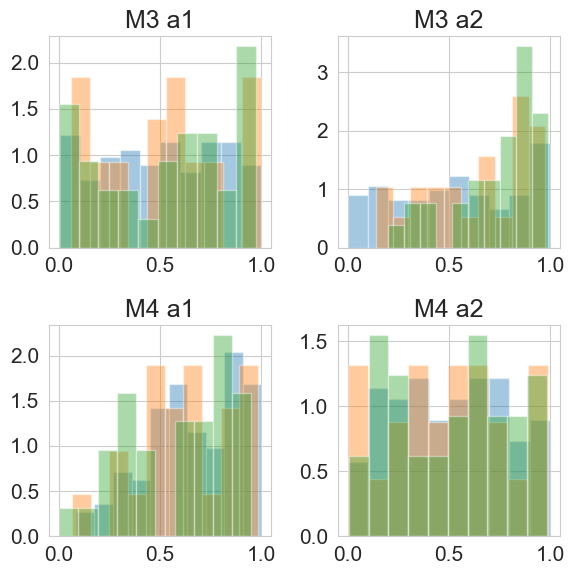

In [34]:
par = 13, 14, 15, 16  # 24, 26
# par = 23, 24, 25, 26  # 24, 26

print(par_names[par[0]], par_names[par[1]])

fig, ax = plt.subplots(2, 2, figsize=(6,6))
idx = scaled_pars[:, 3] >= 0.5
ax[0][0].hist(scaled_pars[idx, par[0]], alpha=0.4, density=True)
ax[0][1].hist(scaled_pars[idx, par[1]], alpha=0.4,density=True)
ax[1][0].hist(scaled_pars[idx, par[2]], alpha=0.4, density=True)
ax[1][1].hist(scaled_pars[idx, par[3]], alpha=0.4, density=True)


idx = (scaled_pars[:, 3] < 0.5) * (scaled_pars[:, 4] < 0.5)
ax[0][0].hist(scaled_pars[idx, par[0]], alpha=0.4, density=True)
ax[0][1].hist(scaled_pars[idx, par[1]], alpha=0.4, density=True)
ax[1][0].hist(scaled_pars[idx, par[2]], alpha=0.4, density=True)
ax[1][1].hist(scaled_pars[idx, par[3]], alpha=0.4, density=True)

idx = (scaled_pars[:, 3] < 0.5) * (scaled_pars[:, 4] > 0.5)
ax[0][0].hist(scaled_pars[idx, par[0]], alpha=0.4, density=True)
ax[0][1].hist(scaled_pars[idx, par[1]], alpha=0.4, density=True)
ax[1][0].hist(scaled_pars[idx, par[2]], alpha=0.4, density=True)
ax[1][1].hist(scaled_pars[idx, par[3]], alpha=0.4, density=True)

ax[0][0].set_title(par_names[par[0]])
ax[0][1].set_title(par_names[par[1]])
ax[1][0].set_title(par_names[par[2]])
ax[1][1].set_title(par_names[par[3]])

plt.tight_layout()
plt.show()

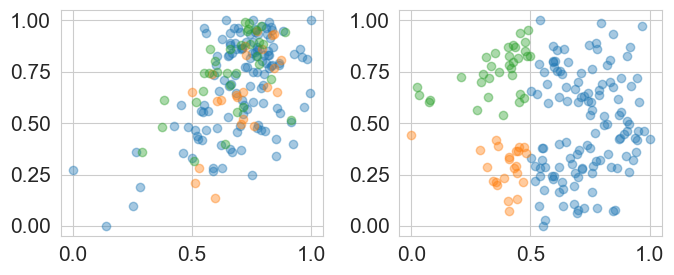

In [35]:
fig, ax = plt.subplots(1, 2, figsize=(7,3))
idx = scaled_pars[:, 3] >= 0.5
ax[0].scatter(scaled_pars[idx, 5], scaled_pars[idx, 6], alpha=0.4)
ax[1].scatter(scaled_pars[idx, 3], scaled_pars[idx, 4], alpha=0.4)

idx = (scaled_pars[:, 3] < 0.5) * (scaled_pars[:, 4] < 0.5)
ax[0].scatter(scaled_pars[idx, 5], scaled_pars[idx, 6], alpha=0.4)
ax[1].scatter(scaled_pars[idx, 3], scaled_pars[idx, 4], alpha=0.4)

idx = (scaled_pars[:, 3] < 0.5) * (scaled_pars[:, 4] > 0.5)
ax[0].scatter(scaled_pars[idx, 5], scaled_pars[idx, 6], alpha=0.4)
ax[1].scatter(scaled_pars[idx, 3], scaled_pars[idx, 4], alpha=0.4)
plt.tight_layout()
plt.show()

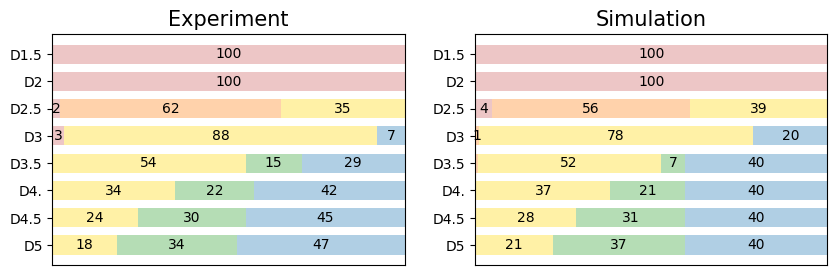

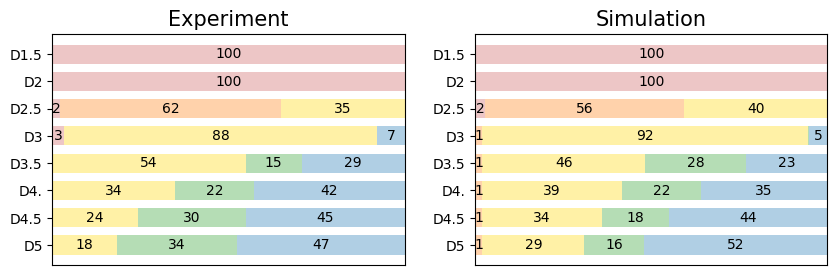

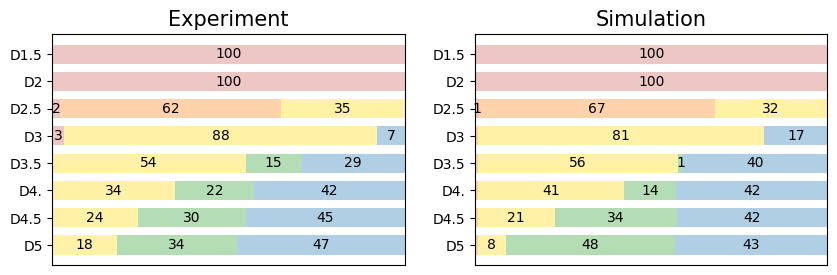

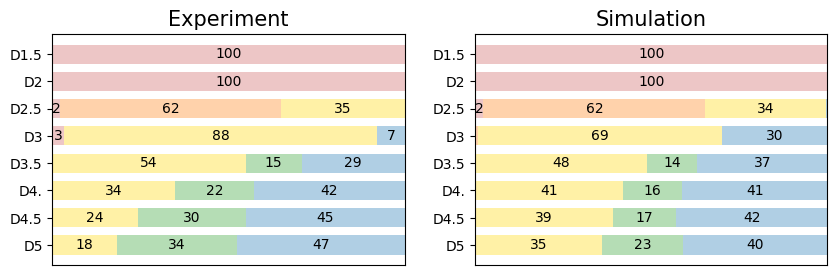

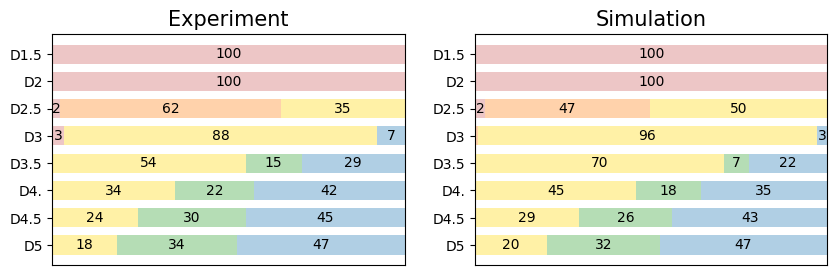

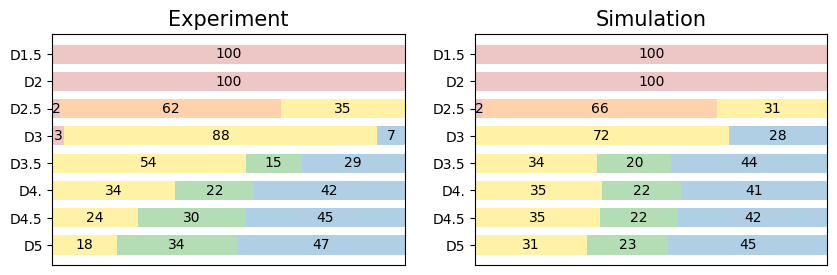

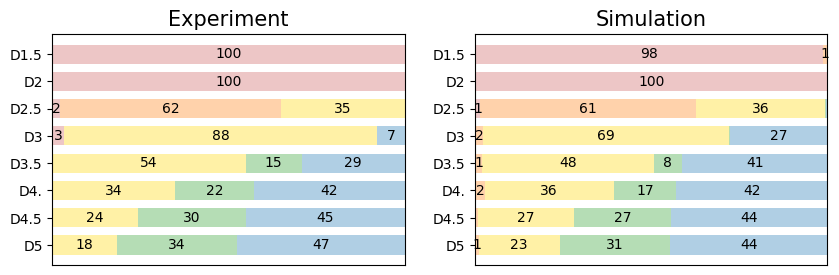

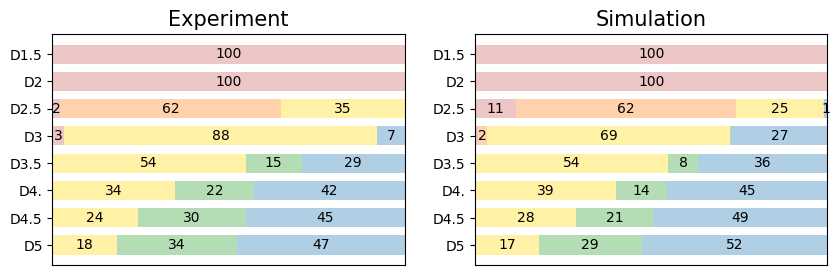

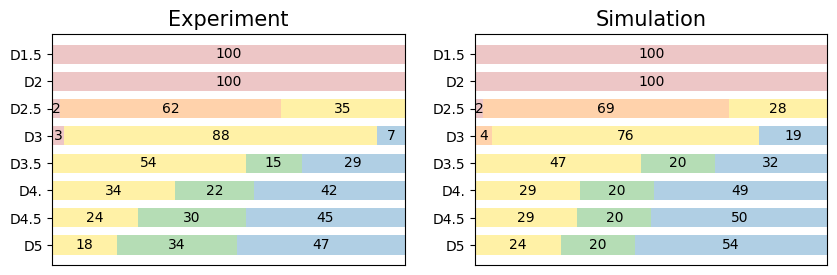

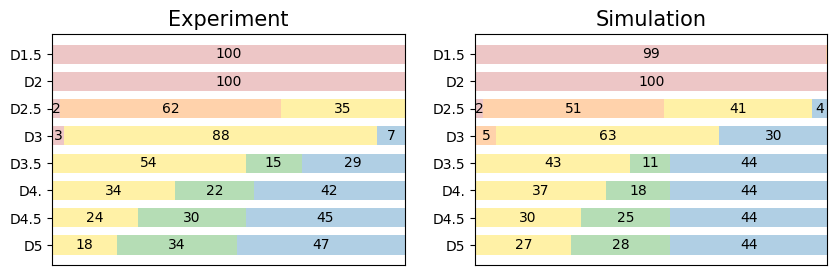

In [36]:
for i in range(10, 20):
    timecode = timecodes.iloc[i]
    figure_from_timecode(timecode, 'proportions_0')
    

In [101]:
# pca = PCA(n_components=None)
# pca.fit(scaled_pars)
# X = pca.transform(scaled_pars)
# 
# print(pca.explained_variance_ratio_)
# 
# plt.imshow(X, interpolation=None, cmap='RdBu_r', aspect=0.25)
# plt.title('PCA scores')
# plt.show()
# plt.imshow(pca.components_, interpolation=None, cmap='RdBu')
# plt.title('PCA components')
# plt.show()
# 
# for component in range(10):
#     plt.plot(pca.components_[component])
# plt.title('PCA components')
# plt.show()
# fig = plt.figure()
# ax = fig.add_subplot(111, projection="3d", elev=30, azim=-100)
# 
# ax.scatter(X[:, 0], X[:, 1], X[:, 2], c = all_fitness)
# plt.show()




2 clusters
-0.1678583927975046 0.028151118948108348
-0.1624610317791093 0.030315706044567247


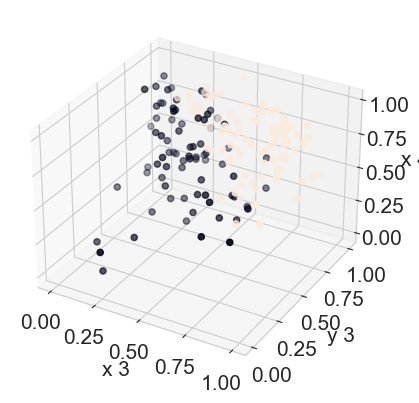

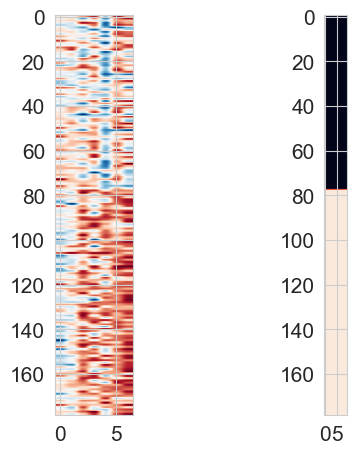

3 clusters
-0.170525276956067 0.028874413073287686
-0.1587980159703074 0.03001520331555265
-0.1666423628594973 0.028340897159552493


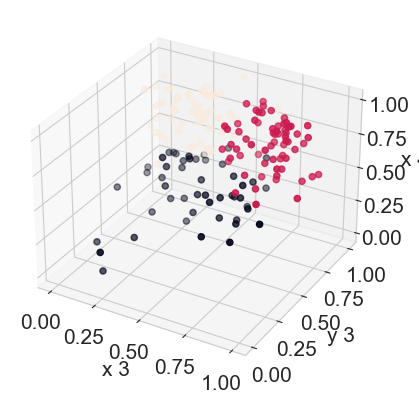

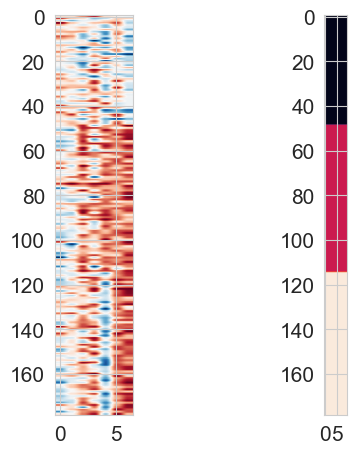

4 clusters
-0.16402063550605753 0.028633256648830846
-0.16204659472412233 0.028773567564007285
-0.1694736679014992 0.02991684120120517
-0.16455391417061982 0.029988748661349568


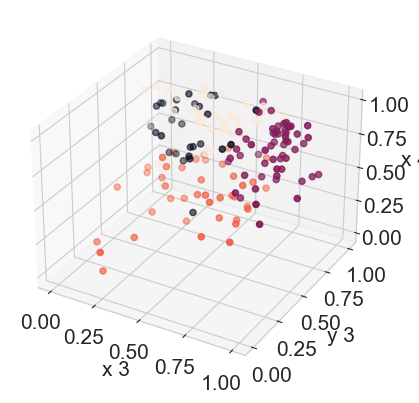

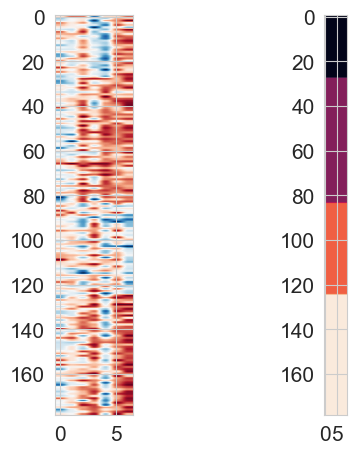

In [37]:
for n_clusters in np.arange(2,5):
    estimator = KMeans(n_clusters=n_clusters)
    X = scaled_pars[:, :7]
    estimator.fit(X)
    labels = estimator.labels_
    
    # print(np.labels)
    print(n_clusters, 'clusters')
    for label in np.unique(labels):
        label_fitness = all_fitness[labels == label]
        print(np.mean(label_fitness), np.std(label_fitness))
    
    fig = plt.figure()
    ax = fig.add_subplot(111, projection="3d", azim=-60, elev=30)
    # ax.scatter(X[:, 1], X[:, 3], X[:, 9], c=labels.astype(float), edgecolor=None)
    ax.scatter(X[:, 4], X[:, 5], X[:, 6], c=labels.astype(float), edgecolor=None)
    
    ax.set_xlabel(par_names[1])
    ax.set_ylabel(par_names[3])
    ax.set_zlabel(par_names[9])
    
    ax.set_xlabel(par_names[3])
    ax.set_ylabel(par_names[4])
    ax.set_zlabel(par_names[5])
    
    plt.show()
    fig, ax = plt.subplots(1,2)
    ax[0].imshow(X[np.argsort(labels), :], interpolation=None, cmap='RdBu_r', aspect=0.2)
    ax[1].imshow(np.tile( np.sort(labels), (10,1)).T)
    fig.tight_layout()
    plt.show()

In [99]:
# n_components = 2
# for perplexity in (5, 10, 30, 50):
#     tsne = TSNE(n_components=n_components,init="random",random_state=0,perplexity=perplexity,max_iter=1000)
#     X = scaled_pars.copy()
#     Y = tsne.fit_transform(X)
#     plt.scatter(Y[:, 0], Y[:, 1], c = all_fitness)
#     plt.show()

In [38]:
print(par_names[:7])
print(par_names[7:17])
print(par_names[17:])
idx = (np.r_[3:7, 11:17, 21:27]).astype('int')
print(par_names[11:17])


['x 0', 'x 1', 'y 1', 'x 3', 'y 3', 'x 4', 'y 4']
['M0 a1', 'M0 a2', 'M1 a1', 'M1 a2', 'M2 a1', 'M2 a2', 'M3 a1', 'M3 a2', 'M4 a1', 'M4 a2']
['M0 s1', 'M0 s2', 'M1 s1', 'M1 s2', 'M2 s1', 'M2 s2', 'M3 s1', 'M3 s2', 'M4 s1', 'M4 s2']
['M2 a1', 'M2 a2', 'M3 a1', 'M3 a2', 'M4 a1', 'M4 a2']


2 components
Score: 1.4857495063950463
0 fitness: -0.16699968958956596 0.0295399314421739
1 fitness: -0.16244822925657865 0.02930217665225605
Cluster 0


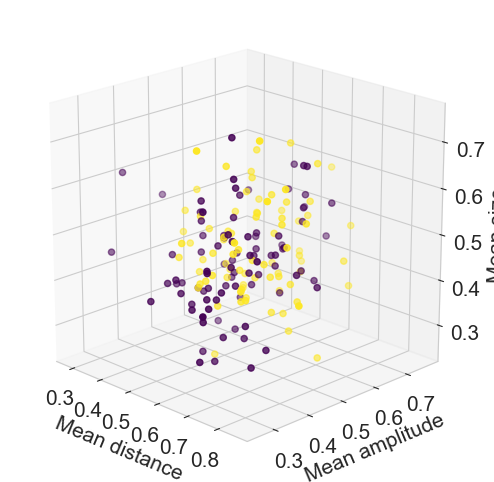

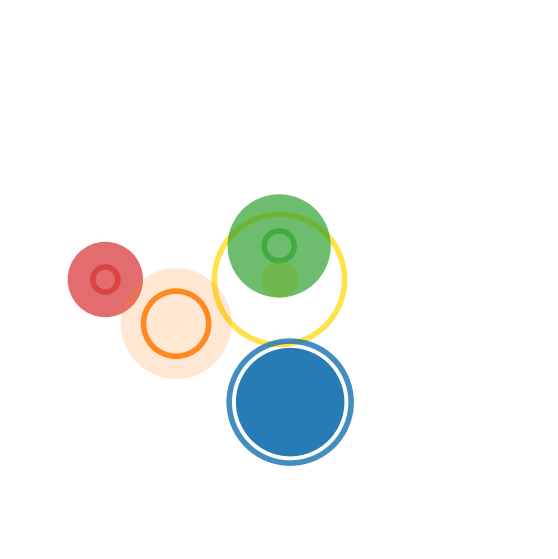

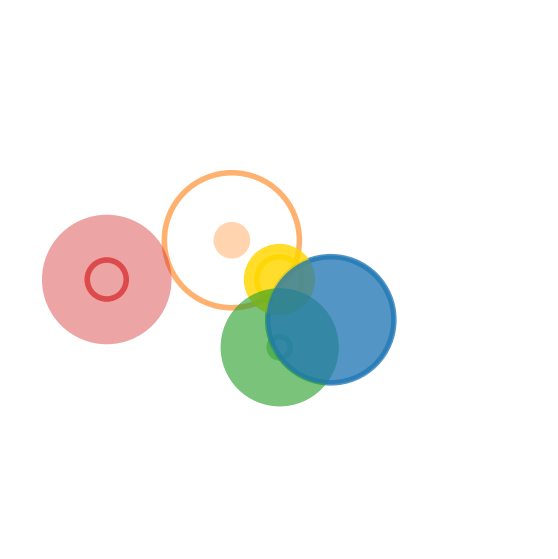

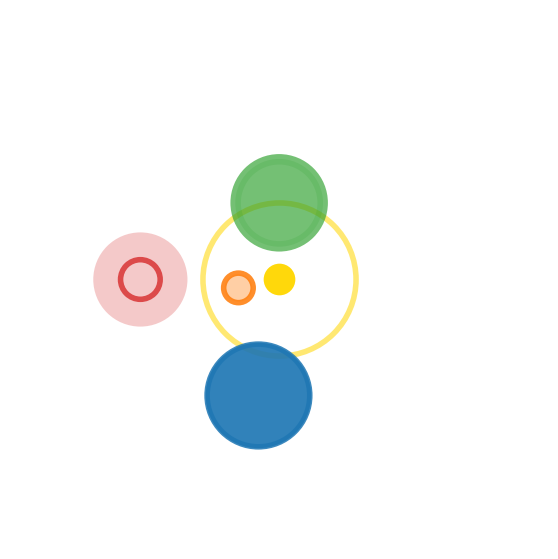

Cluster 1


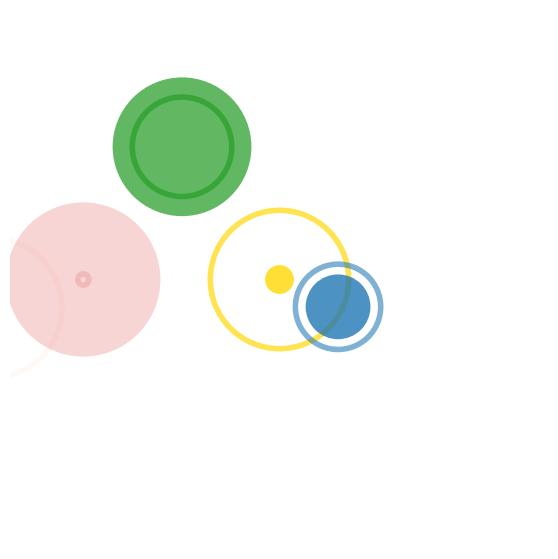

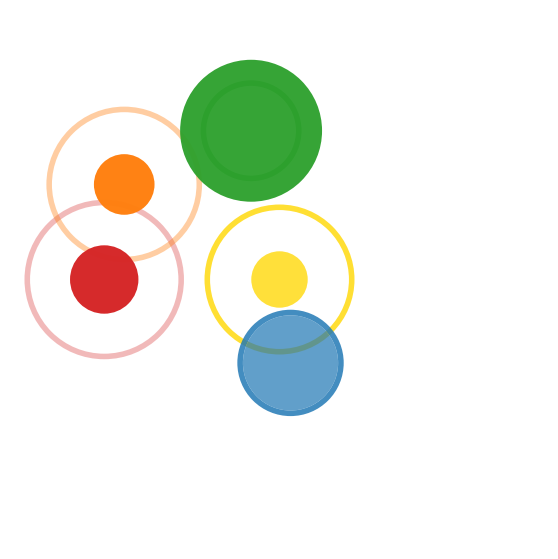

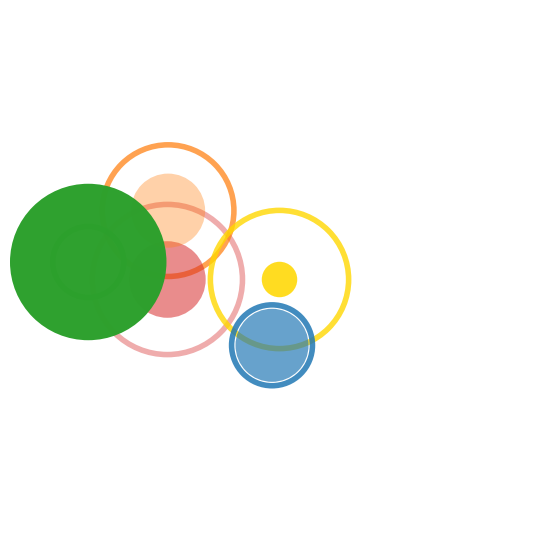

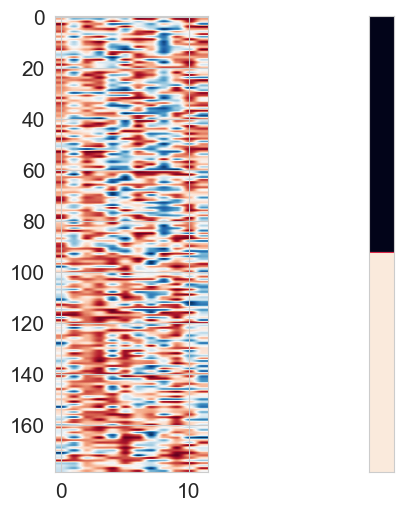

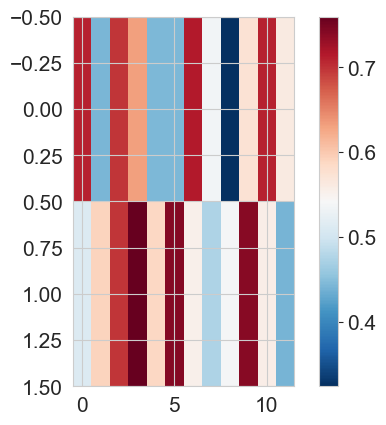

3 components
Score: 2.1086622555621397
0 fitness: -0.16800988281406928 0.028298091543081452
1 fitness: -0.16197040561976572 0.029726941564324226
2 fitness: -0.16611096064066722 0.02969232949794463
Cluster 0


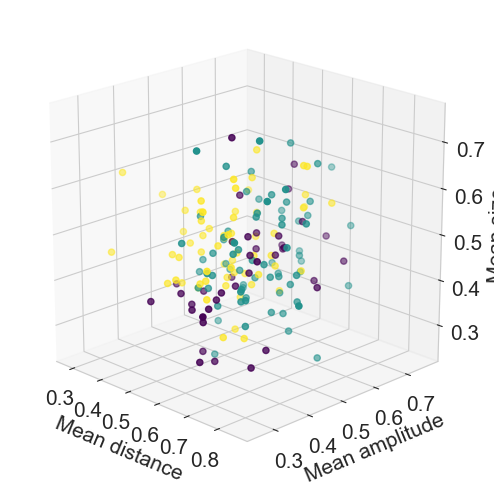

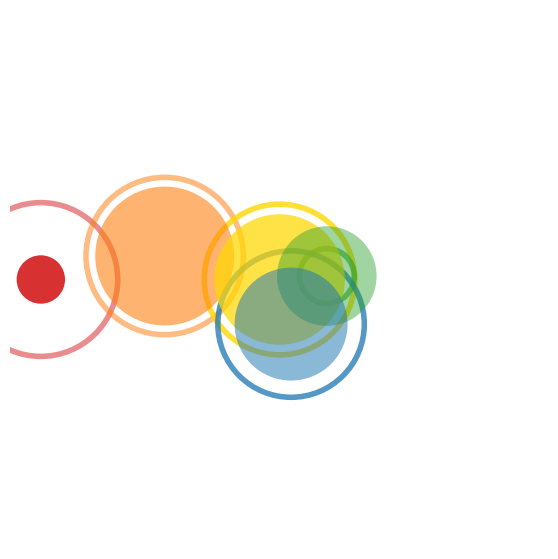

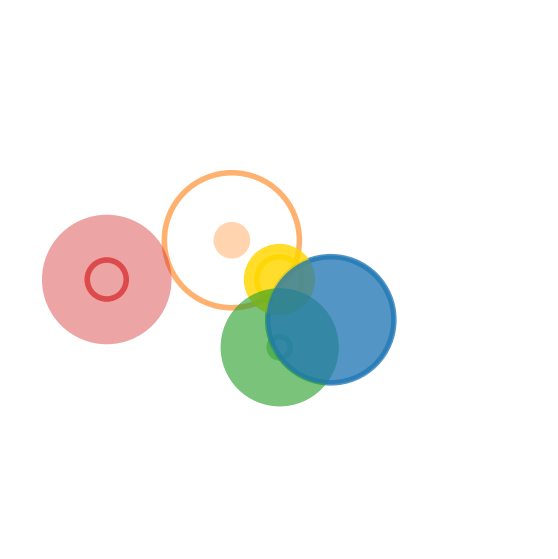

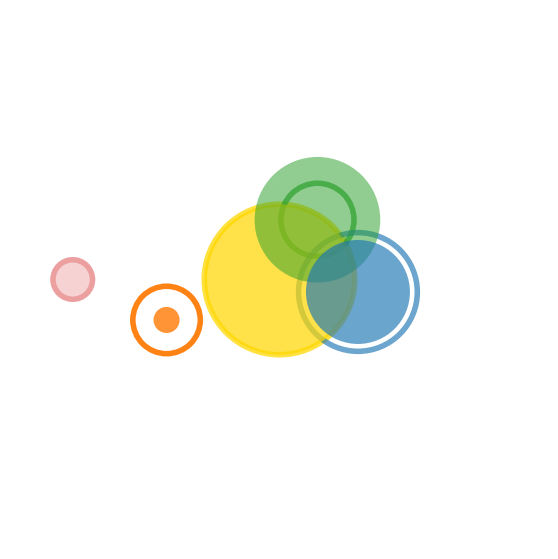

Cluster 1


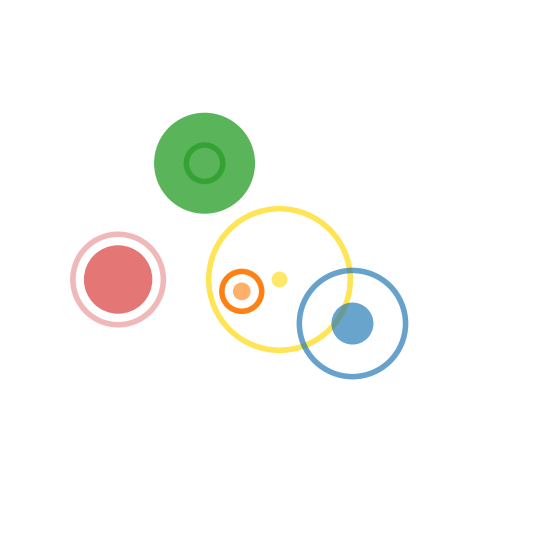

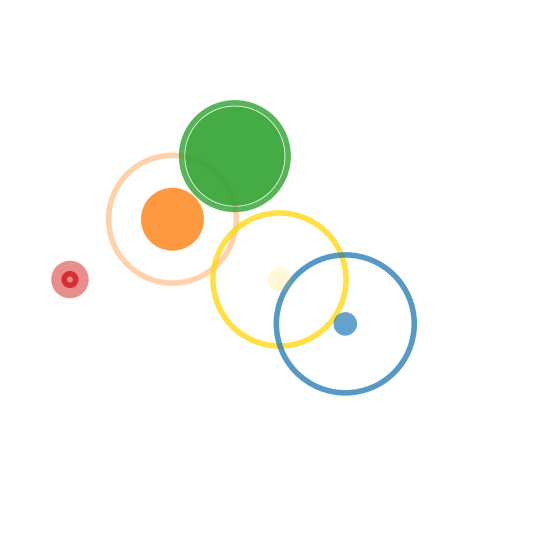

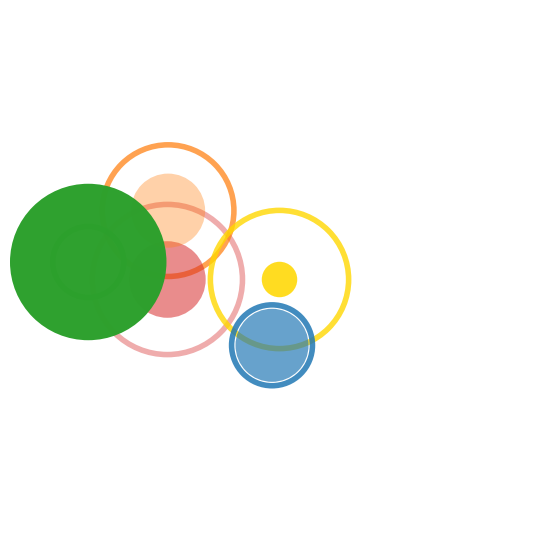

Cluster 2


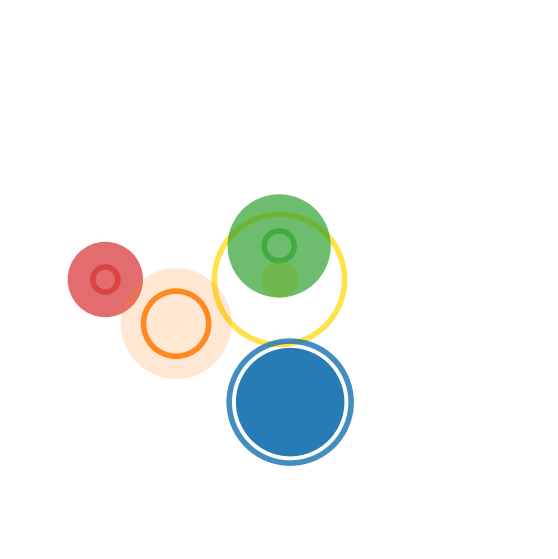

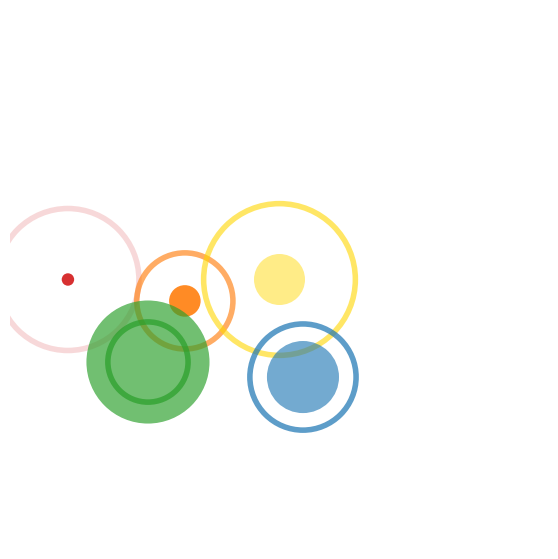

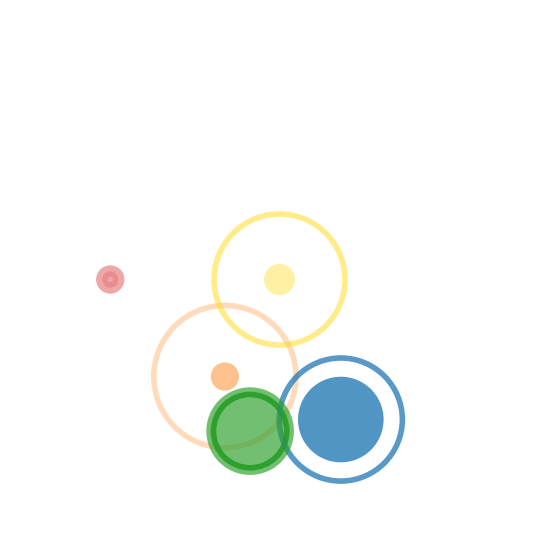

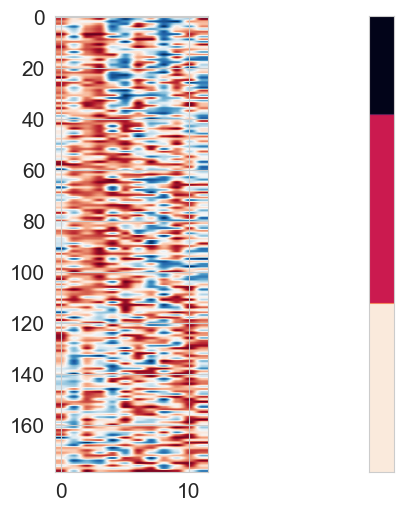

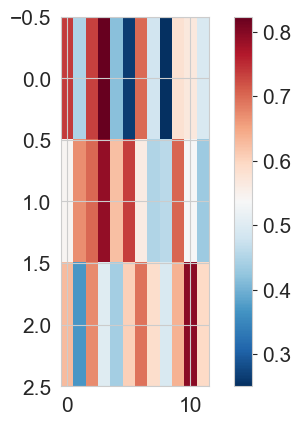

4 components
Score: 2.4903425432179107
0 fitness: -0.16772788609775735 0.02844618466050255
1 fitness: -0.16002543379899348 0.03055011022171793
2 fitness: -0.16825606580459804 0.027637994096366338
3 fitness: -0.16414525741627242 0.030295708759236102
Cluster 0


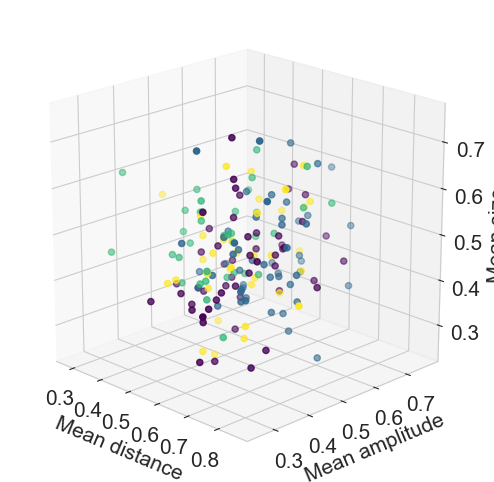

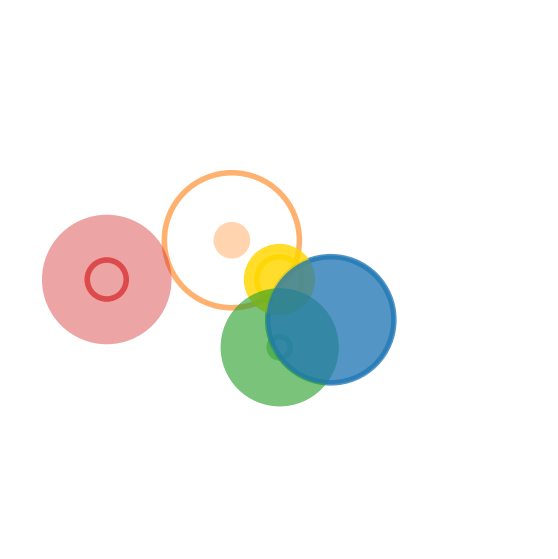

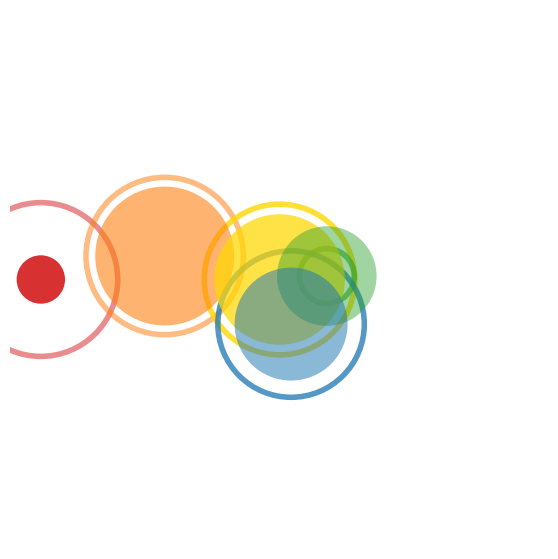

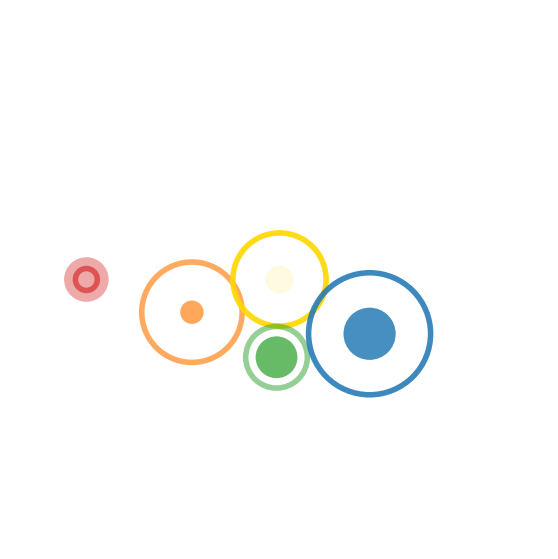

Cluster 1


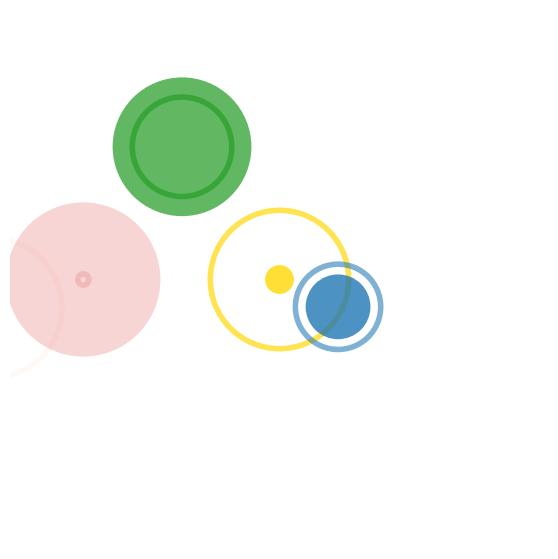

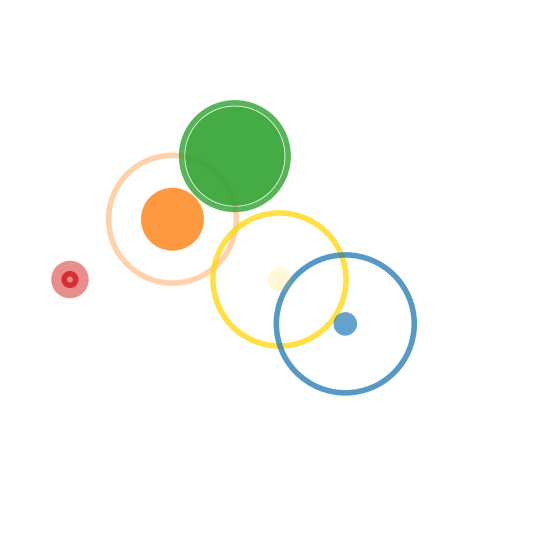

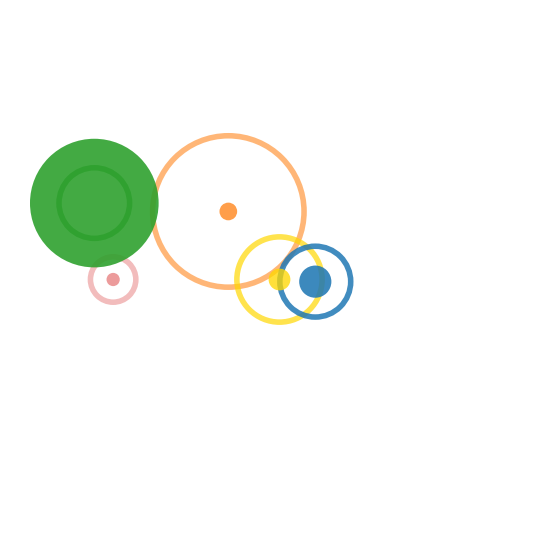

Cluster 2


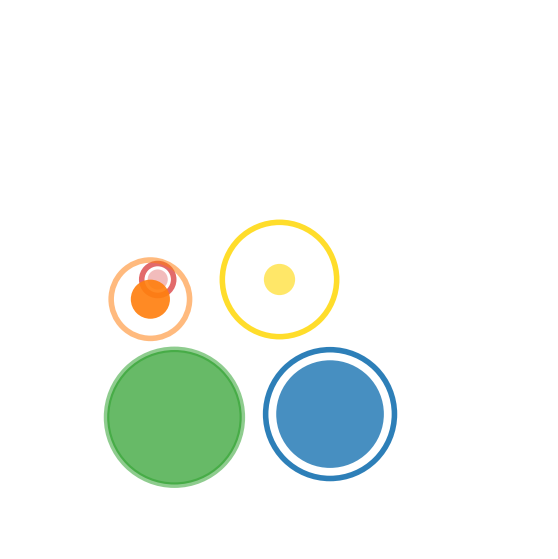

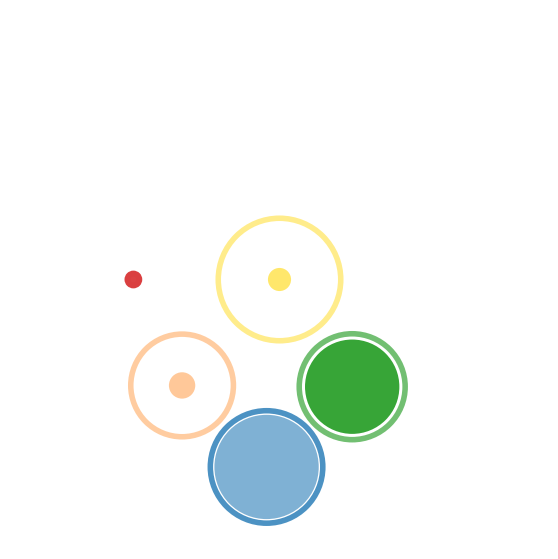

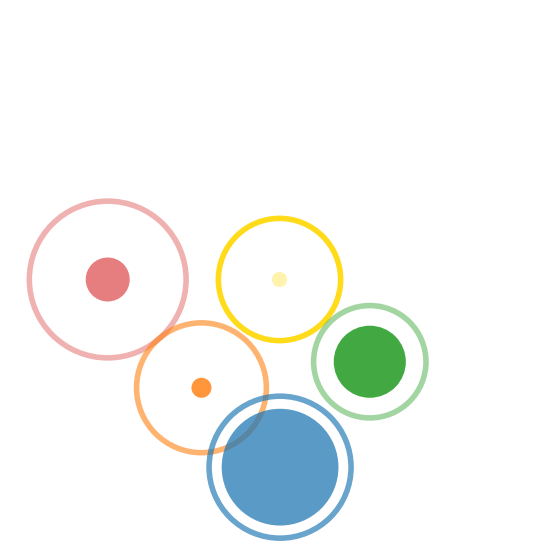

Cluster 3


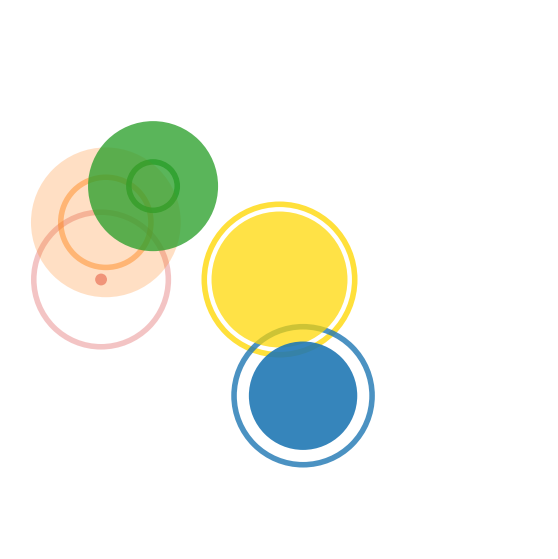

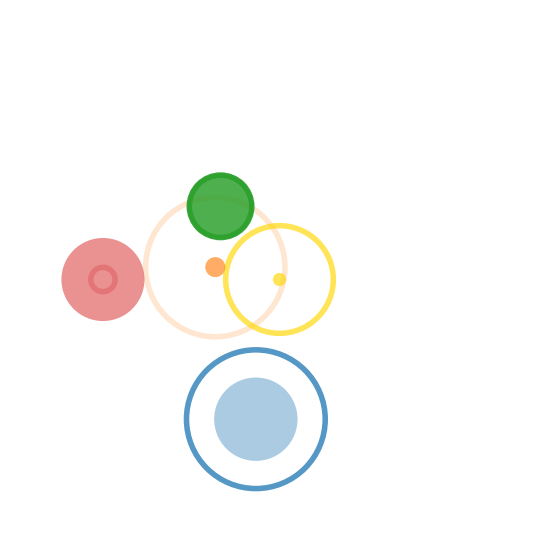

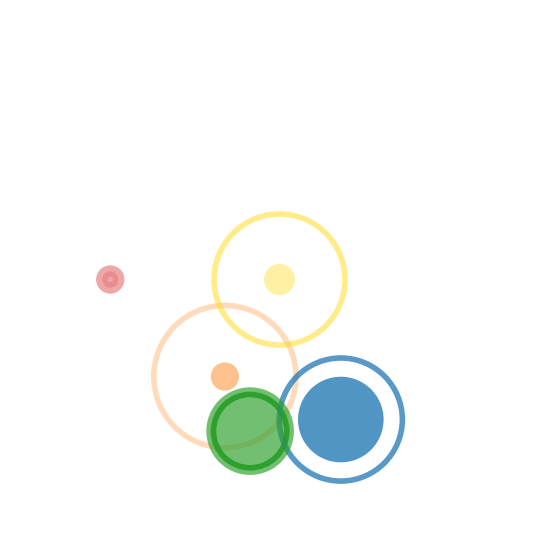

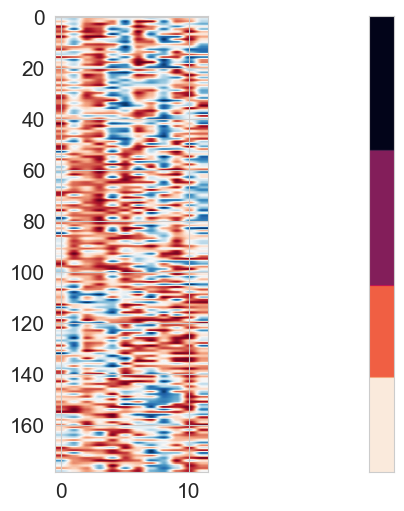

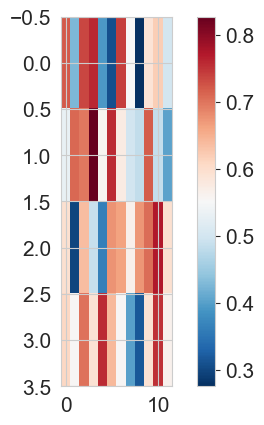

5 components
Score: 3.206829476859469
0 fitness: -0.17026891348384626 0.02620557140842327
1 fitness: -0.15798523521093183 0.02972214981864584
2 fitness: -0.16761758204189722 0.028137874099977755
3 fitness: -0.1596135751261485 0.03062286739335673
4 fitness: -0.16978829116425836 0.030099869688735525
Cluster 0


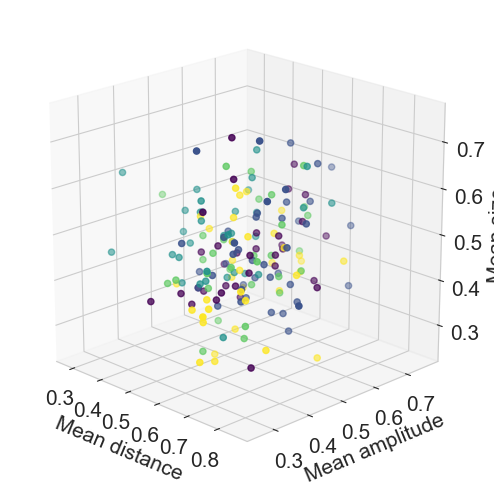

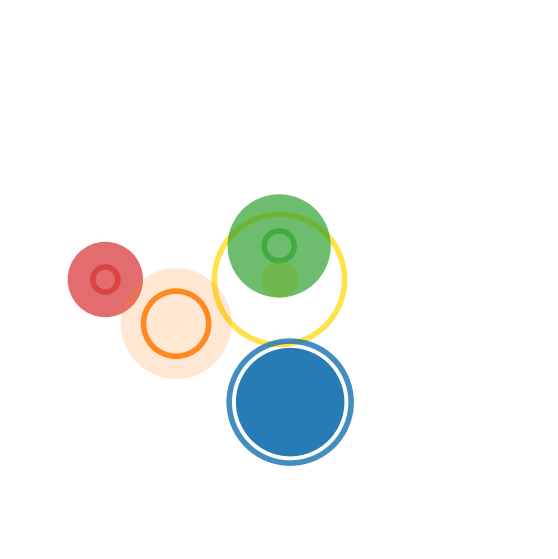

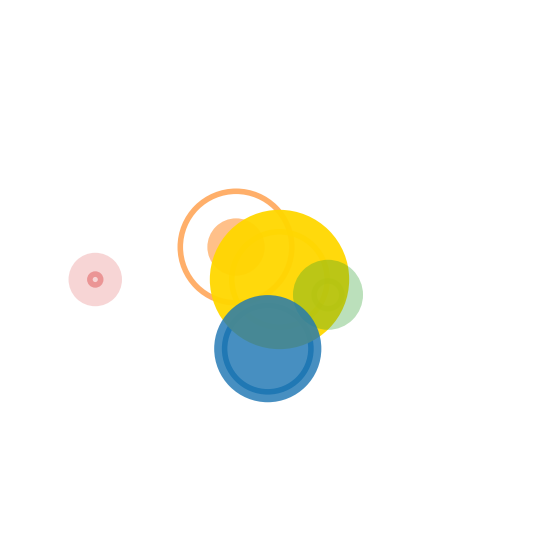

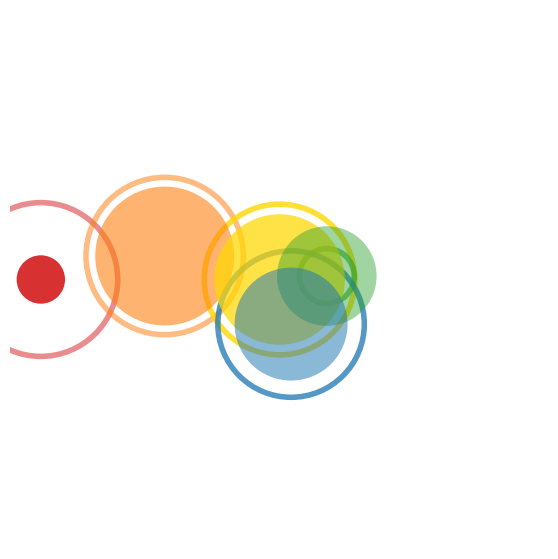

Cluster 1


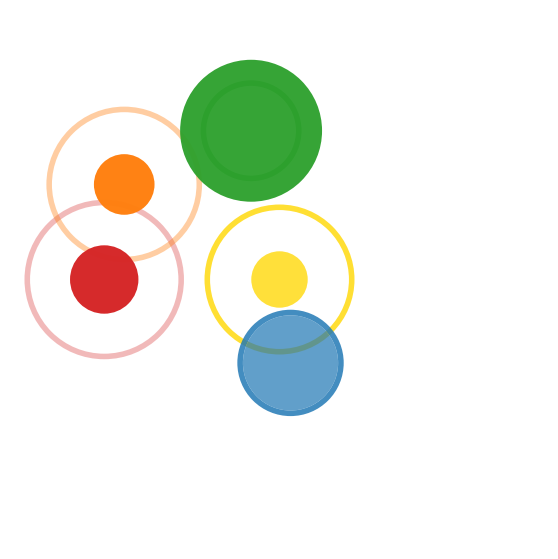

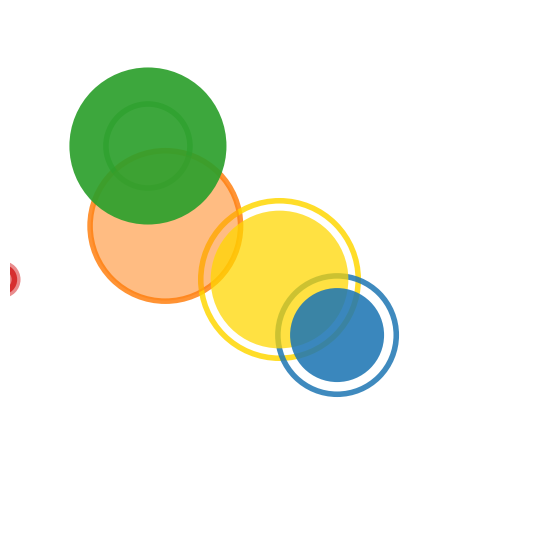

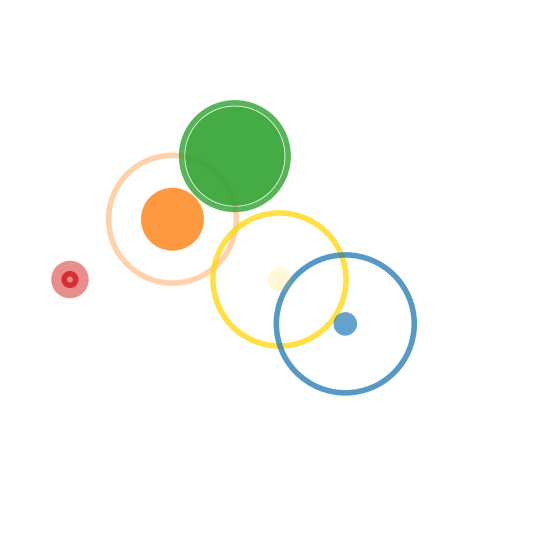

Cluster 2


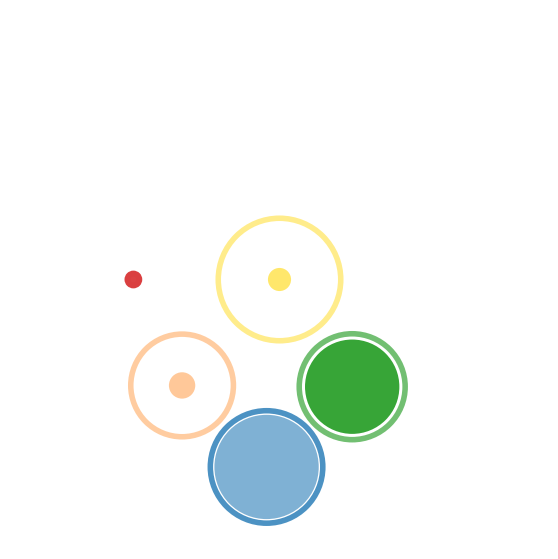

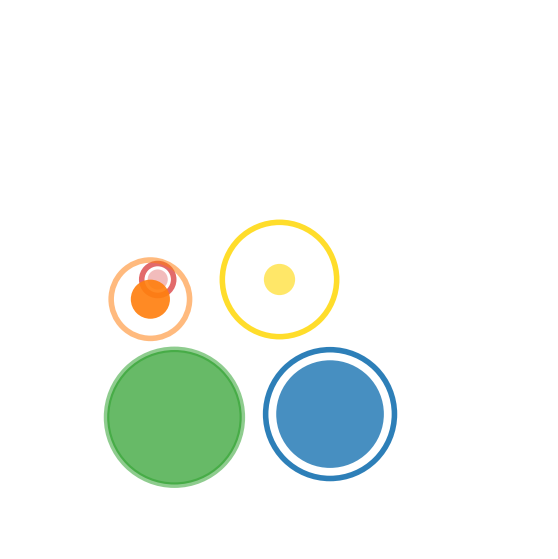

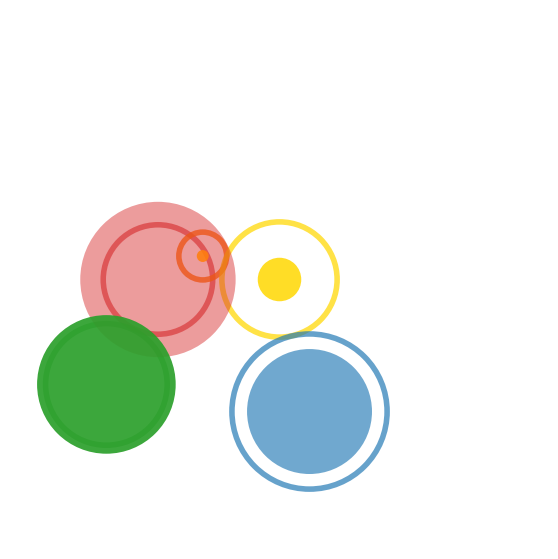

Cluster 3


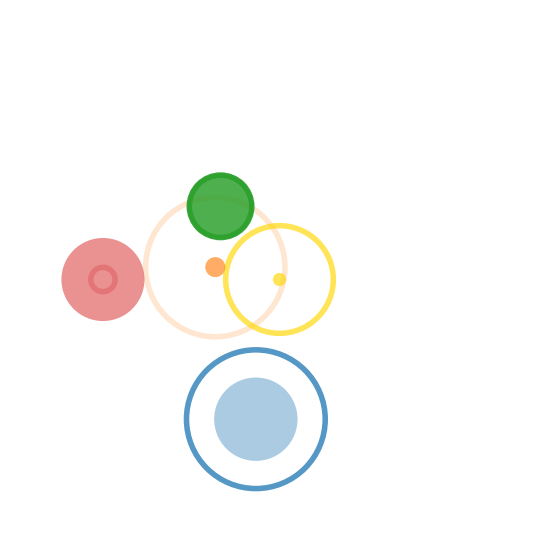

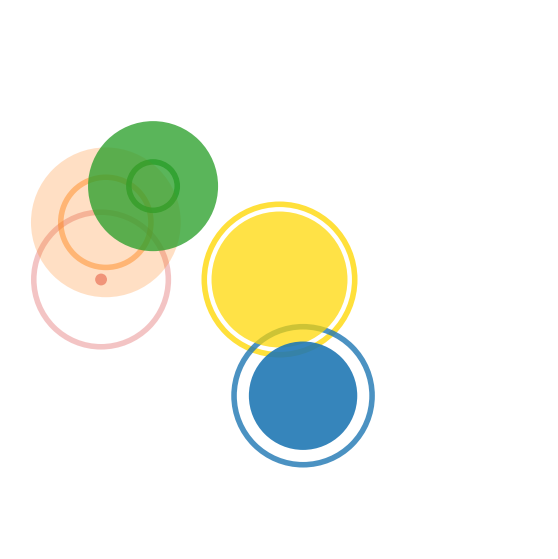

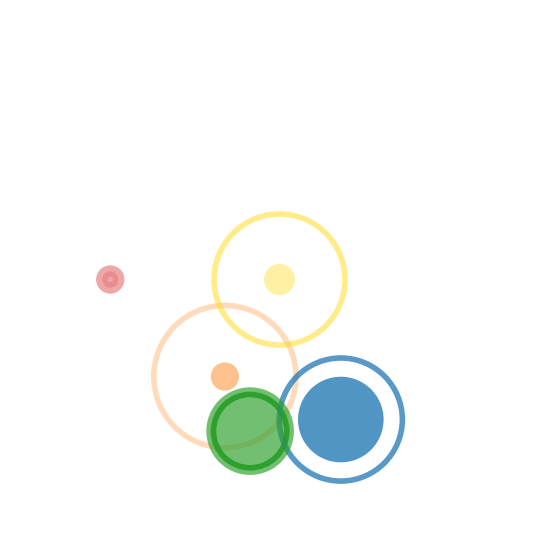

Cluster 4


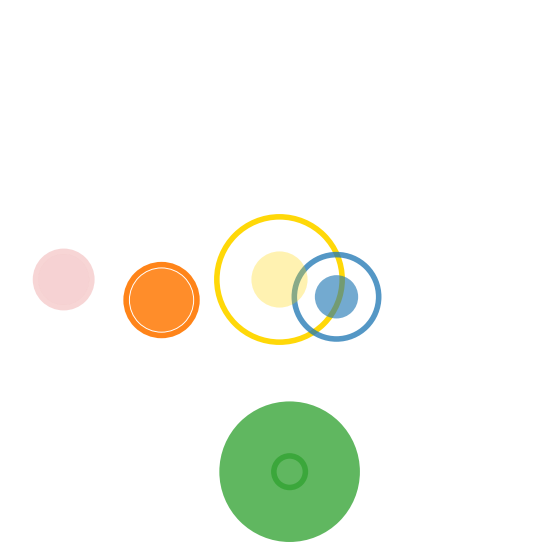

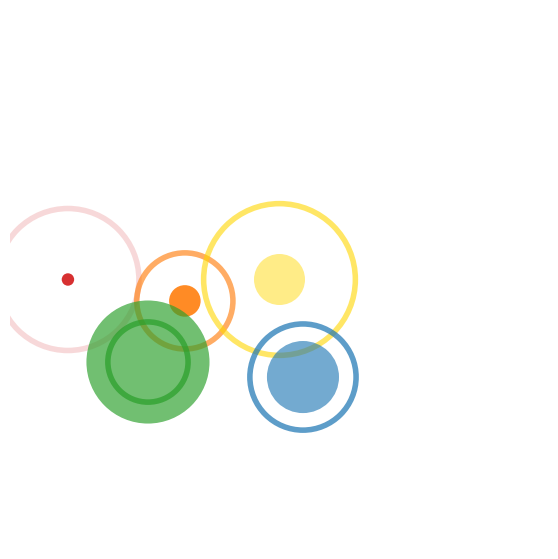

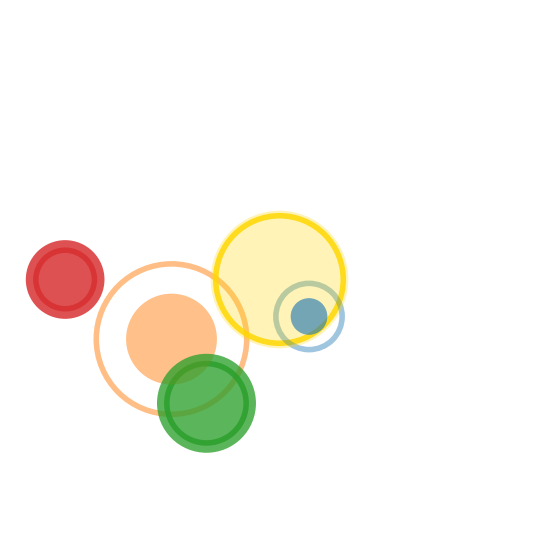

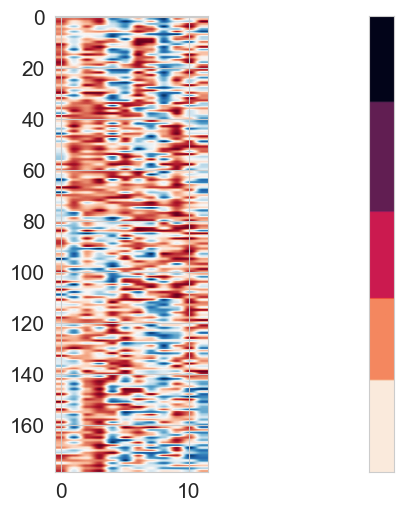

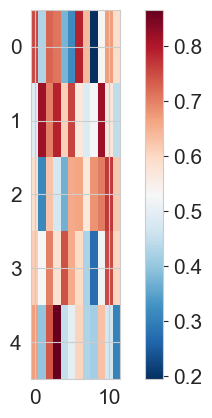

In [39]:
from sklearn.mixture import GaussianMixture
# X  = scaled_pars[:, 3:7, 13:17, 23:27]
X = scaled_pars[:, np.r_[3:7, 13:17, 23:27]]
for n_components in (2,3,4,5):
    print(n_components, 'components')
    gm = GaussianMixture(n_components=n_components, random_state=0, covariance_type='full').fit(X)

    labels = gm.fit_predict(X)
    
    print('Score:', gm.score(X))
    
    for label in np.unique(labels):
        label_fitness = all_fitness[labels == label]
        print(label, 'fitness:', np.mean(label_fitness), np.std(label_fitness))
        
    fig = plt.figure(figsize=(8,6))
    ax = fig.add_subplot(111, projection="3d", azim=-45, elev=20)
    ax.set_aspect('equal')
    # ax.scatter(X[:, 1], X[:, 3], X[:, 9], c=labels.astype(float), edgecolor=None)
    # ax.set_xlabel(par_names[1])
    # ax.set_ylabel(par_names[3])
    # ax.set_zlabel(par_names[9])
    avg_dist = np.mean(scaled_pars[:, :7], axis=1)
    avg_a = np.mean(scaled_pars[:, 7:17], axis=1)
    avg_s = np.mean(scaled_pars[:, 17:], axis=1)
    # ax.scatter(X[:, 4], X[:, 5], X[:, 6], c=labels.astype(float), edgecolor='None', cmap='viridis')
    ax.scatter(avg_dist, avg_a, avg_s, c=labels.astype(float), edgecolor=None, cmap='viridis')
    ax.set_xlabel('Mean distance')
    ax.set_ylabel('Mean amplitude')
    ax.set_zlabel('Mean size')
    
    #  #  plot the landscapes closest to the center and the cluster mean _______________
    # Xc = np.zeros((n_components, 3))
    for k in range(n_components):
        
        Xk = X[labels==k, :]
        all_pars_k = all_pars[labels==k, :]
        timecodes_k = timecodes[labels==k]
        ind = np.argmin(np.linalg.norm(Xk - gm.means_[k], 1, axis=1))
        timecode = timecodes_k.iloc[ind]
        
        print('Cluster', k)
        
        idx = np.argpartition(np.linalg.norm(Xk - gm.means_[k], 1, axis=1), 3)
        circle_plot(all_pars_k[idx[0]])
        circle_plot(all_pars_k[idx[1]])
        circle_plot(all_pars_k[idx[3]])
        
        
        # figure_from_timecode(timecode, 'landscape_1')
        # figure_from_timecode(timecode, 'landscape_2')
        

        # Xc[k] = Xk[ind, 1], Xk[ind, 3], Xk[ind, 9]
        # landscape=landscape_from_timecode(timecode, data_dir, 299, landscape_pars)
        # print(landscape)
    # ax.scatter(Xc[:, 0], Xc[:, 1], Xc[:, 2], c=range(n_components), marker = 'o', s=100, alpha=1)
    # means = gm.means_
    # ax.scatter(means[:, 1], means[:, 3], means[:, 9], c=range(n_components), marker = '*', s=150, alpha=1)
    
    # plt.legend()
    # plt.tight_layout()
    plt.show()


#  uncomment _________________
    fig, ax = plt.subplots(1,2, figsize=(5,5), width_ratios=(9,1), constrained_layout=True)
    ax[0].imshow(X[np.argsort(labels), :], interpolation=None, cmap='RdBu_r', aspect=0.2)
    ax[1].imshow(np.tile( np.sort(labels), (10,1)).T)
    ax[1].set_yticks([])
    ax[1].set_xticks([])
    plt.show()
    
    plt.imshow(gm.means_, cmap='RdBu_r', aspect=10)
    plt.colorbar()
    plt.show()
# ____________________
    

    # scores = gm.score_samples(X[np.argsort(labels), :])
    # plt.plot(scores)
    # plt.show()
    # for k in range(n_components):
    #     dist = np.linalg.norm(X[np.argsort(labels)] - gm.means_[k], 2, axis=1)   
    #     plt.plot(dist)
    #     plt.ylim((0,10))
    # plt.show()
    # plt.legend()

    # print(np.round(gm.means_, 2))




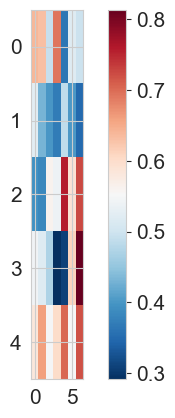

In [104]:
plt.imshow(gm.means_, cmap='RdBu_r', aspect=10)
plt.colorbar()

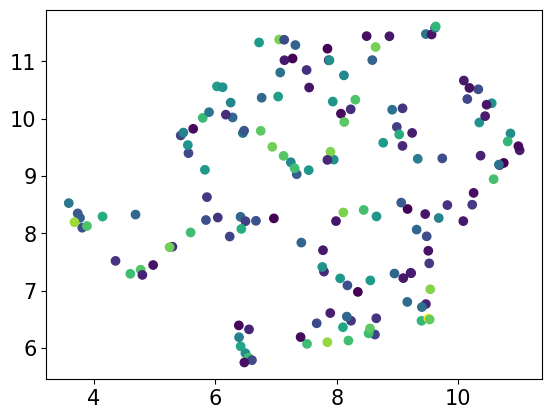

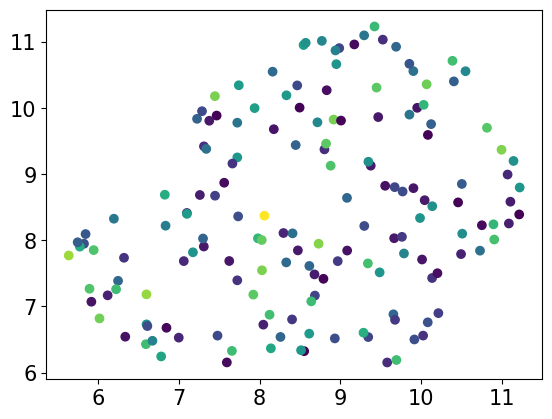

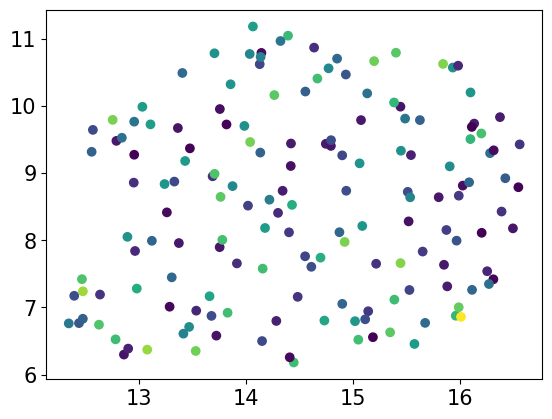

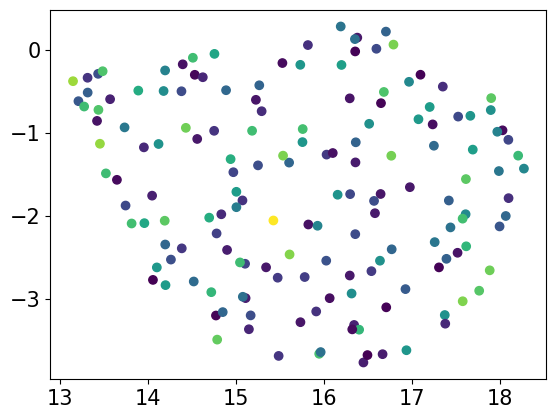

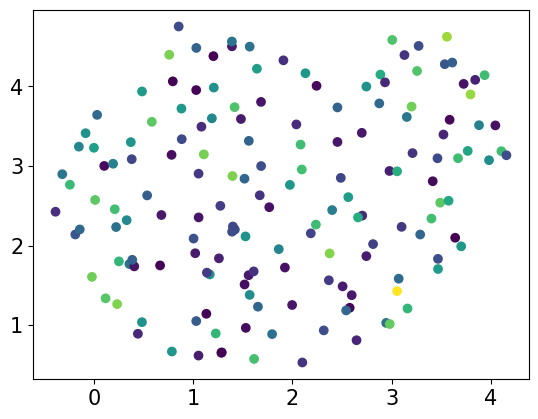

In [152]:
import umap


for n_neighbors in (5, 10, 20, 30, 50):
    
    reducer = umap.UMAP(n_neighbors=n_neighbors, metric='euclidean')
    
    embedding = reducer.fit_transform(all_pars)
    
    plt.scatter(embedding[:, 0], embedding[:, 1], c = all_fitness)
    plt.show()

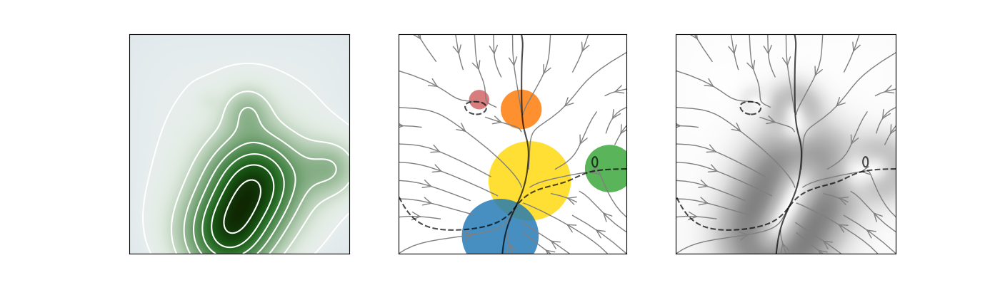

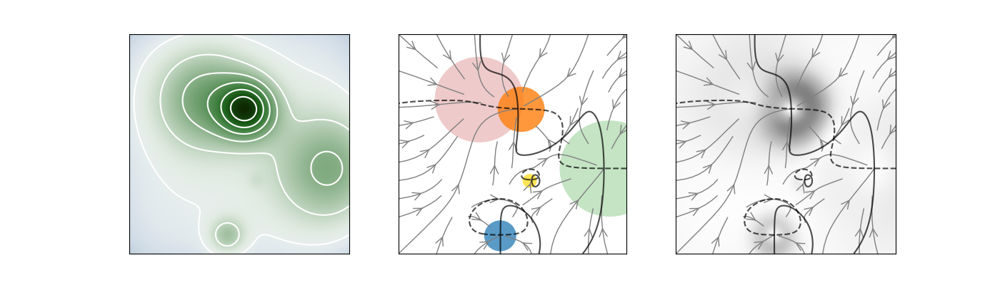

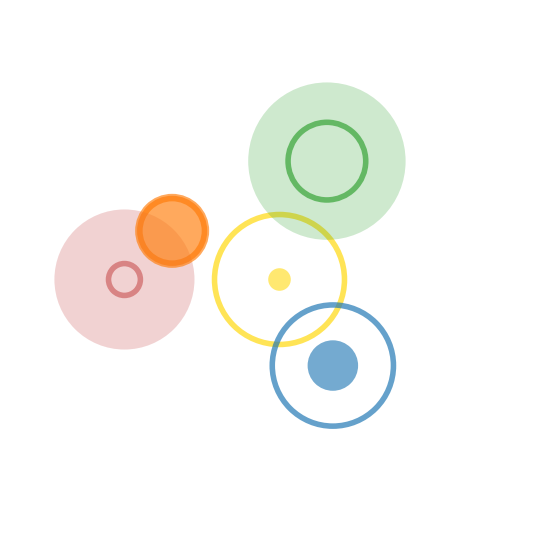

In [236]:
figure_from_timecode(timecodes.iloc[17], 'landscape_1', data_dirs[0])
figure_from_timecode(timecodes.iloc[17], 'landscape_2', data_dirs[0])
circle_plot(all_pars[17])